# CRISPR and Other Perturbation Analysis

## Setup

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import pertpy as pt
from warnings import warn
import seaborn as sb
import scanpy as sc
import pandas as pd
import numpy as np
import corescpy as cr

pd.options.display.max_columns = 100

# Options
DIR = "/mnt/cho_lab/disk2/elizabeth/projects/crispr-screening"
file_perts = os.path.join(DIR, "data/04172024_CRISPRi_IBD_guides.xlsx")
files = {
    "HH03": dict(directory=f"{DIR}/data/HH03"),
    "HH04": dict(directory=f"{DIR}/data/HH04"),
    "HH05": dict(directory=f"{DIR}/data/HH05"),
    "HH06": dict(directory=f"{DIR}/data/HH06"),
    "HH07": dict(directory=f"{DIR}/data/HH-Hu-CR5"),
    "HH09": dict(directory=f"{DIR}/data/HH-Hu-CR4")
}

# Annotation Options
assign = pd.read_csv(os.path.join(os.path.expanduser(
    "~"), "corescpy/examples/markers_lineages.csv"), index_col=0)
col_annotation = "group"
assign = assign[assign["Bucket"].isin(["Monocyte"])][[col_annotation]]

# Guide RNA Preprocessing Arguments
kws_process_guide_rna = {
    "feature_split": "|", "guide_split": "-",
    "key_control_patterns": ["NEG_CTRL"],
    "remove_multi_transfected": True,
    "file_perturbations": file_perts,
    "key_multiple": "multiple",
    "key_unassigned": "unassigned",
    "kws_filter": {
        "remove_contaminated_control": True,
        "drop_control_at_least_3_transfected": True,
        "max_pct_control_drop": 75,
        "min_pct_control_keep": 100,
        "min_pct_dominant": 80,
        "min_pct_avg_n": 40,
        "min_n": 0
    }
}

# Preprocessing Parameters
outlier_mads = {"pct_counts_mt": [None, 5], "pct_counts_ribo": [None, 5],
                "n_counts": [5, None]}
kws_pp = {"kws_hvg": True, "target_sum": 1e4, "kws_scale": "log",
          "regress_out": None, "outlier_mads": outlier_mads,
          "cell_filter_ngene": [3, None], "gene_filter_n_cell": [3, None]}

# Clustering Parameters
kws_cluster = {"kws_umap": {"min_dist": 0.3}, "use_highly_variable": True,
               "resolution": 1.2}

# Downstream
genes_of_interest = ["CDKN1A", "PLAUR", "TP53", "IL6ST", "IL1A",
                     "CXCL8", "CCL2", "CEBPB", "NFKB1", "IGFBP7",
                     "PTGER4", "TGFB1", "ATG16L1", "NOD2", "LACC1"]

# Define Column Names, Keys for Control, Metadata, etc.
csid = "subject"
kwargs_init = dict(col_gene_symbols="gene_symbols",
                   col_cell_type="leiden",
                   col_sample_id="sample",
                   col_subject_id=csid,
                   col_condition="perturbation",
                   col_target_genes="target_gene",
                   col_perturbed="perturbed",
                   col_guide_rna="feature_call",
                   col_num_umis="num_umis",
                   key_control="NEG_CTRL",
                   key_treatment="KD",
                   kws_process_guide_rna=kws_process_guide_rna)
ids = {
    "HH03": {"MDP": "No MDP", "Oxia": "Normoxia", csid: "CR3"},
    "HH04": {"MDP": "MDP", "Oxia": "Normoxia", csid: "CR3"},
    "HH05": {"MDP": "No MDP", "Oxia": "Hypoxia", csid: "CR3"},
    "HH06": {"MDP": "MDP", "Oxia": "Hypoxia", csid: "CR3"},
    "HH07": {"MDP": "MDP", "Oxia": "Hypoxia", csid: "CR5"},
    "HH09": {"MDP": "MDP", "Oxia": "Hypoxia", csid: "CR4"},
}  # metadata per-sample

## Integrate Samples

This code integrates the samples using Harmony after preprocessing and clustering them individually.

For brevity, the output isn't shown; however, you can see an example in the "Integrated Single-Cell and Condition-Based Analyses" tutorial.

To re-load instead of re-performing integration, use the following code:

```python
self = cr.Crispr(
    str("/mnt/cho_lab/disk2/elizabeth/projects/crispr-screening/"
        "analysis/corescpy/HH03__HH04__HH05__HH06__HH07__HH09_revised.h5ad"),
    **{**kwargs_init, "kws_process_guide_rna": False}, integrated=True)
```



<<< INITIALIZING CRISPR CLASS OBJECT >>>

Unused keyword arguments: {'col_subject_id': 'subject'}.



<<< INITIALIZING OMICS CLASS OBJECT >>>





col_gene_symbols="gene_symbols"
col_cell_type="leiden"
col_sample_id="sample"
col_batch="sample"
col_subject=None
col_condition="perturbation"
col_num_umis="num_umis"








key_control="NEG_CTRL"
key_treatment="KD"
key_table=None






<<< LOADING PROTOSPACER METADATA >>>


Counts: Initial


	Observations: 15078

	Genes: 36601






<<< PERFORMING gRNA PROCESSING/FILTERING >>>

{'remove_contaminated_control': True, 'drop_control_at_least_3_transfected': True, 'max_pct_control_drop': 75, 'min_pct_control_keep': 100, 'min_pct_dominant': 80, 'min_pct_avg_n': 40, 'min_n': 0}


	*** CLASSIFYING FOR gRNA FILTERING


Dropped 11208 out of 15078 observations (74.33%) during guide RNA filtering.


Counts: Post-gRNA Processing


	Observations: 3870

	Genes: 36601







 AnnData object with n_obs × n_vars = 3870 × 36601
    obs: 'num_features', 'fe

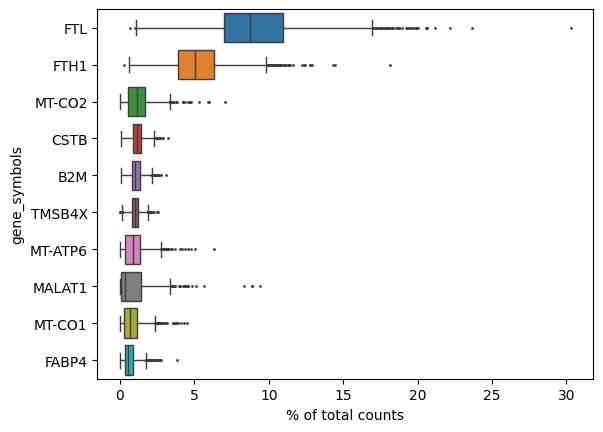



Counts: Initial


	Observations: 3870

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




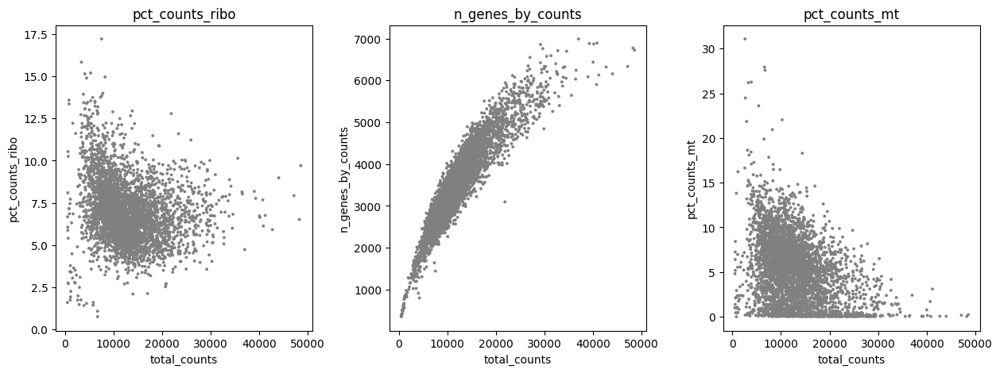


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 3870

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              91.886305   
50%                6.0     0.001550           0.001549              99.844961   
75%              314.0     0.089664           0.085869             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%           6.0            1.945910  
75%         347.0            5.852202  





Counts: Post-`min_cell`


	Observations: 3870

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              91.886305   
50%                6.0     0.001550           0.001549              99.844961   
75%              314.0     0.089664           0.085869             100.00000

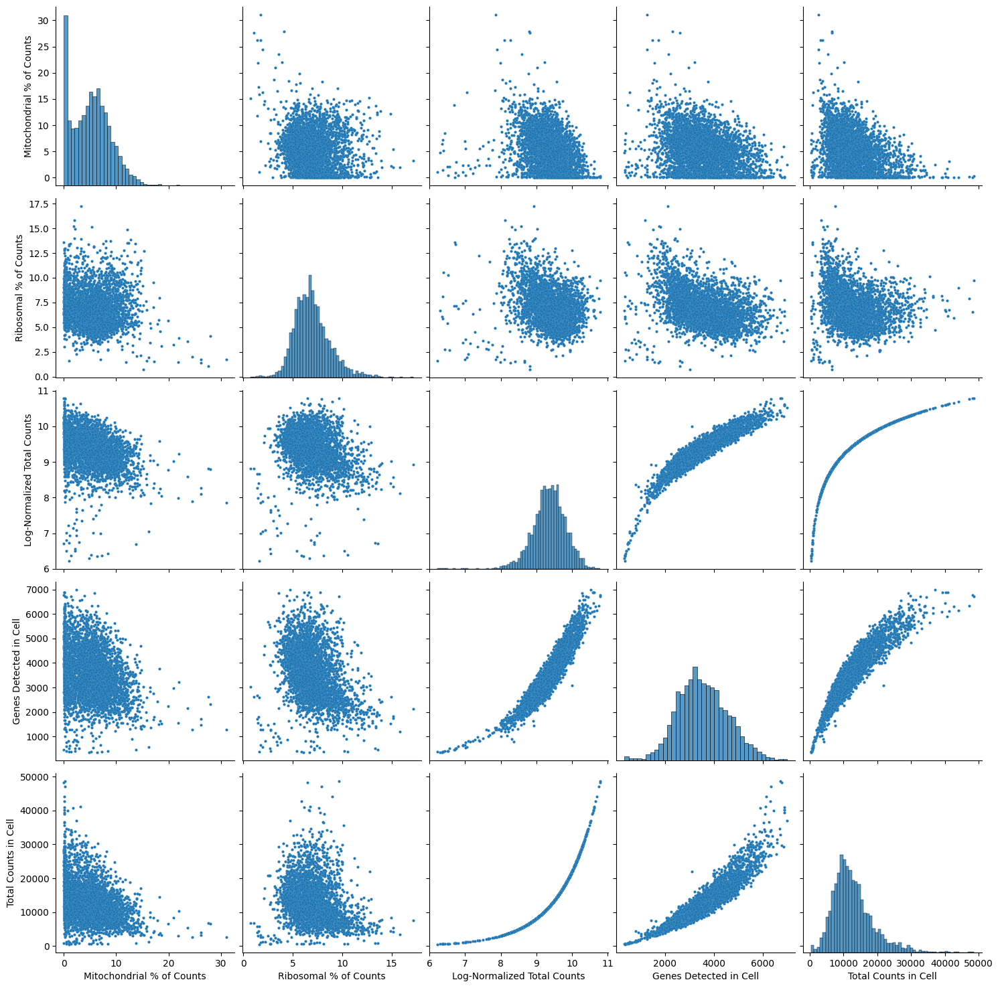

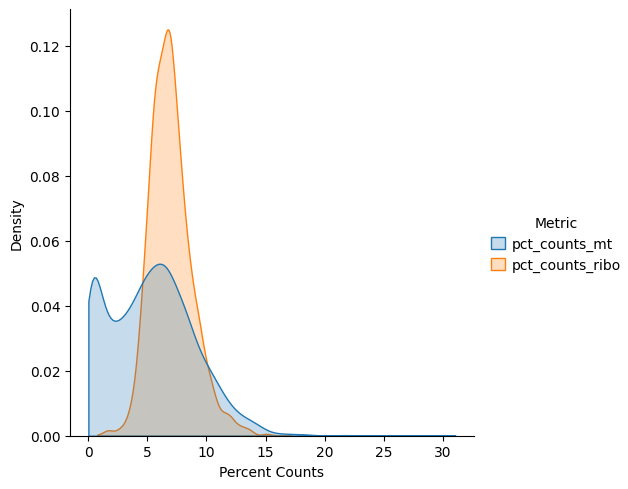

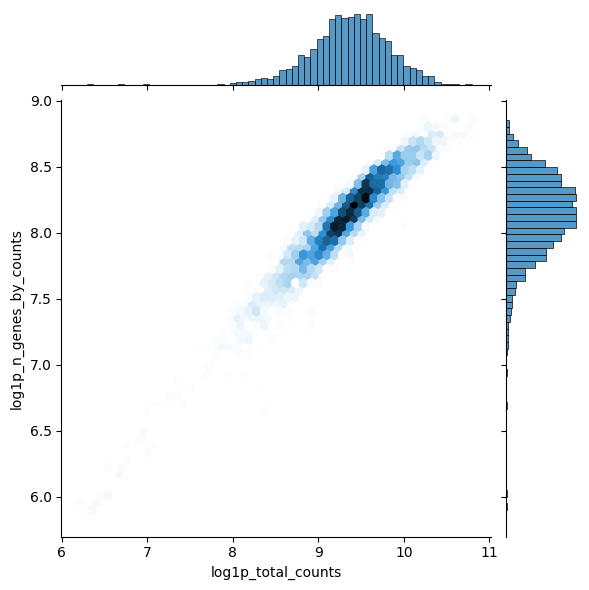

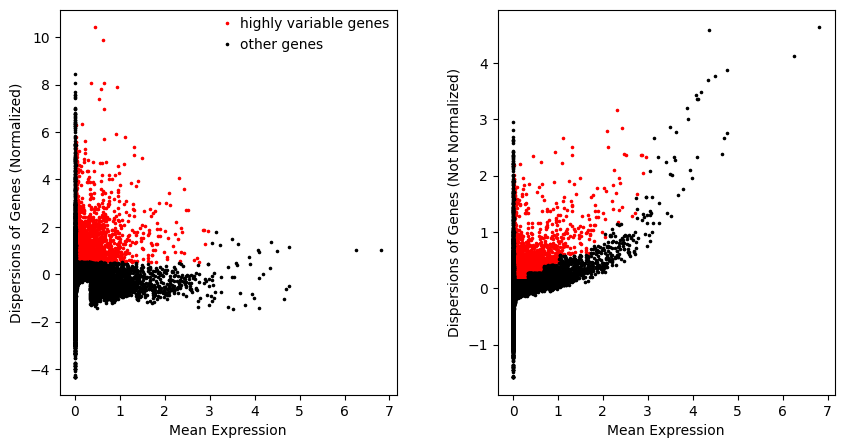


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 3818

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              91.886305   
50%                6.0     0.001550           0.001549              99.844961   
75%              314.0     0.089664           0.085869             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12    -0.148568   
50%           6.0            1.945910  1.252035e-03    -0.002593   
75%         347.0            5.852202  6.788120e-02     0.149220   

     dispersions_norm      mean       std  
25%         -0.484904  0.000000  0.045995  
50%         -0.016414  0.000886  0.281471  
75%          0.380705  0.048554  1.000000  




<<< CLUSTERING HH03 >>>


Un-used Keyword Ar

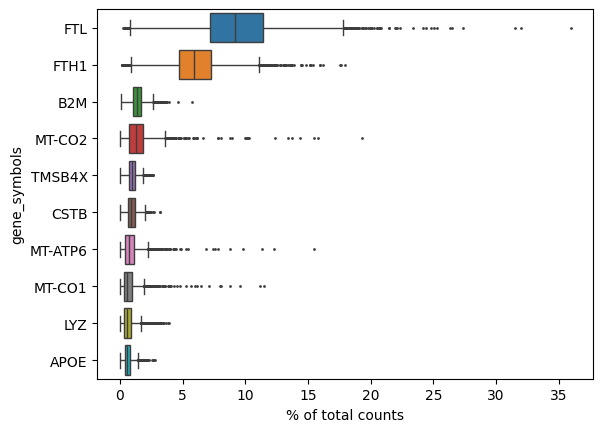



Counts: Initial


	Observations: 5931

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




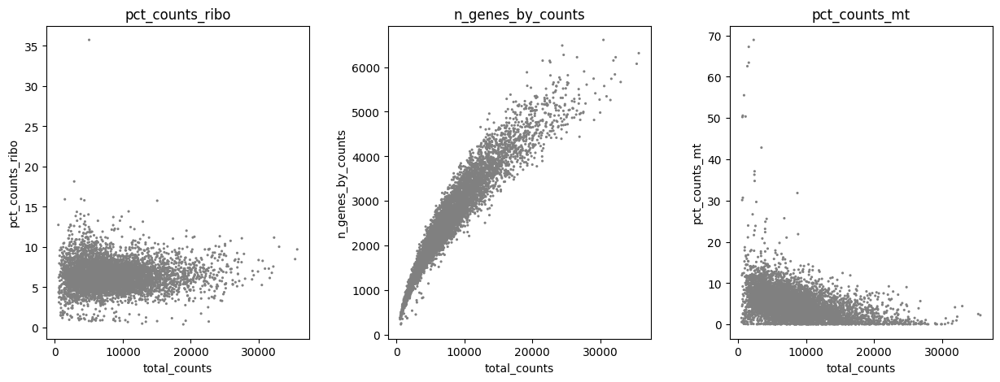


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 5931

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.806947   
50%                6.0     0.001012           0.001011              99.898837   
75%              308.0     0.056314           0.054786             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%           6.0            1.945910  
75%         334.0            5.814131  





Counts: Post-`min_cell`


	Observations: 5931

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.806947   
50%                6.0     0.001012           0.001011              99.898837   
75%              308.0     0.056314           0.054786             100.00000

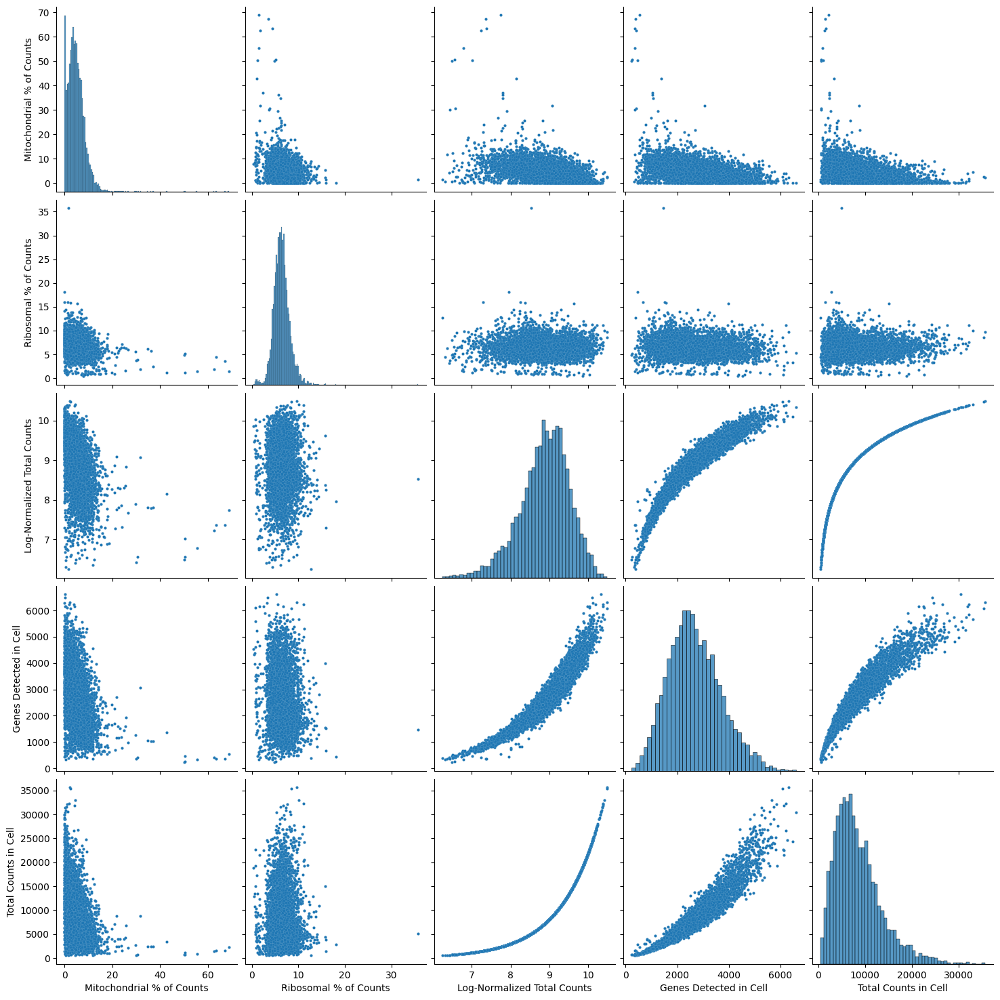

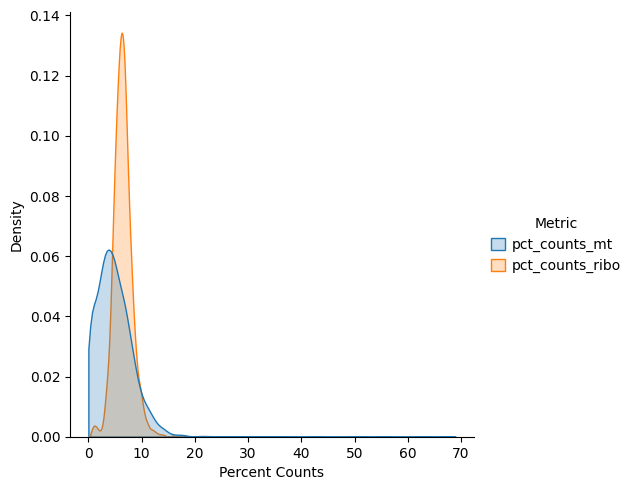

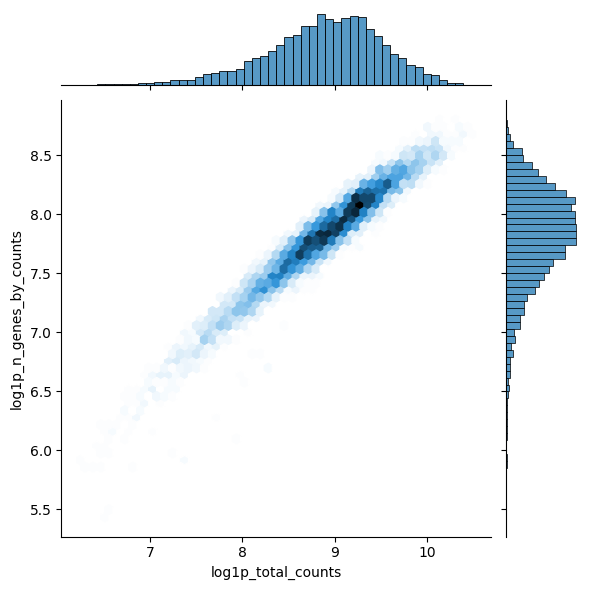

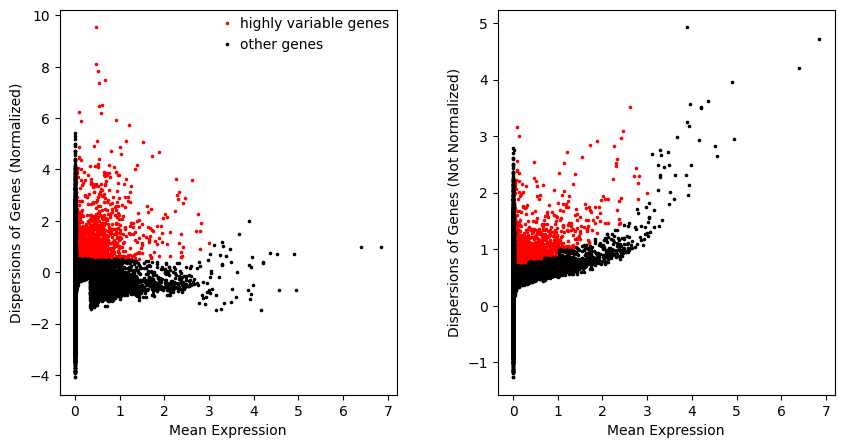


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 5813

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.806947   
50%                6.0     0.001012           0.001011              99.898837   
75%              308.0     0.056314           0.054786             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12     0.368023   
50%           6.0            1.945910  1.213011e-03     0.567693   
75%         334.0            5.814131  6.481147e-02     0.721476   

     dispersions_norm      mean       std  
25%         -0.503327  0.000000  0.051702  
50%          0.071318  0.000733  0.318649  
75%          0.481537  0.040071  1.000000  




<<< CLUSTERING HH04 >>>


Un-used Keyword Ar

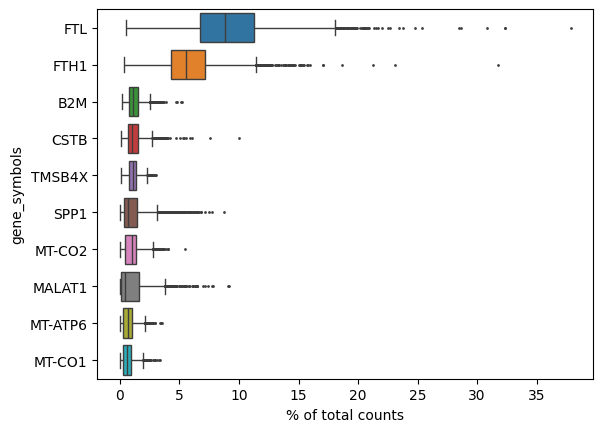



Counts: Initial


	Observations: 4671

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




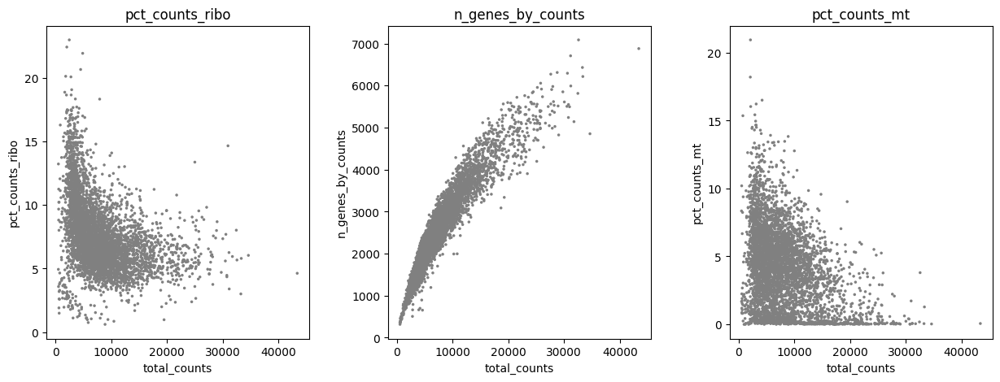


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 4671

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.669236   
50%                5.0     0.001070           0.001070              99.892957   
75%              249.0     0.057803           0.056195             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%           5.0            1.791759  
75%         270.0            5.602119  





Counts: Post-`min_cell`


	Observations: 4671

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.669236   
50%                5.0     0.001070           0.001070              99.892957   
75%              249.0     0.057803           0.056195             100.00000

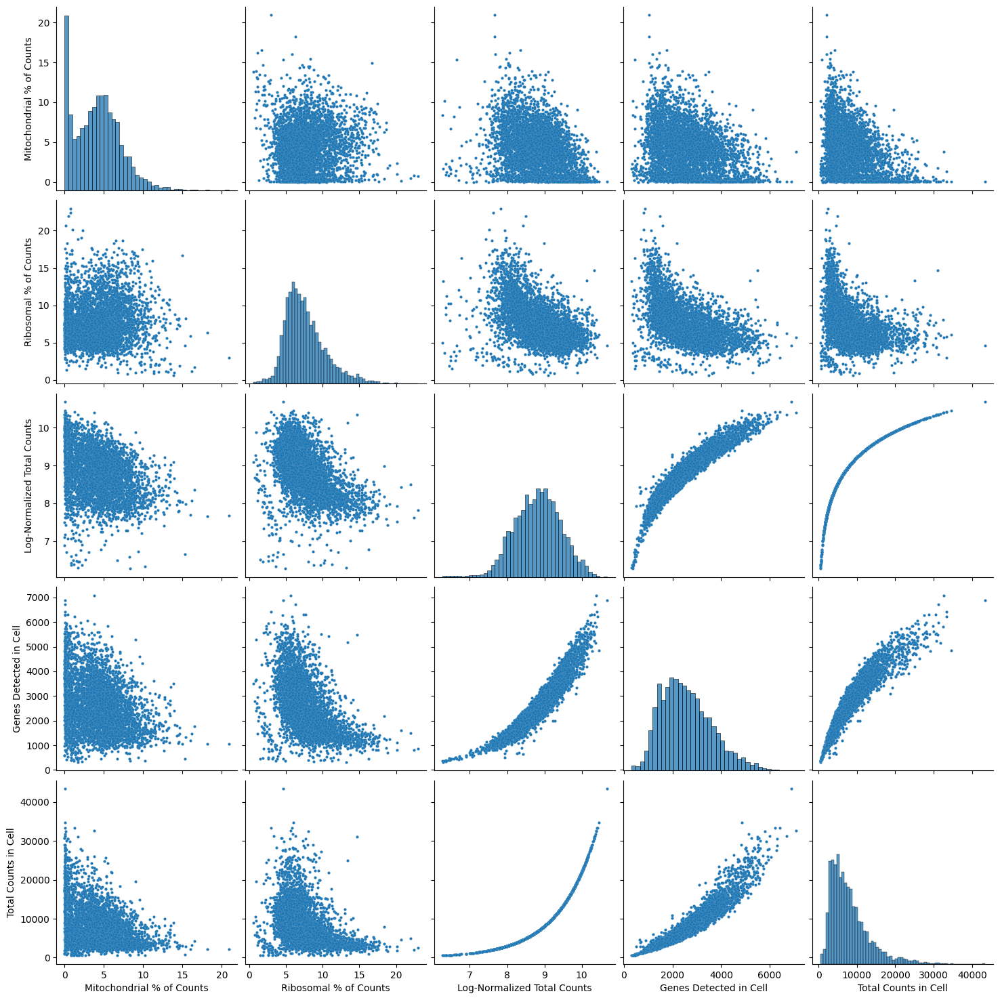

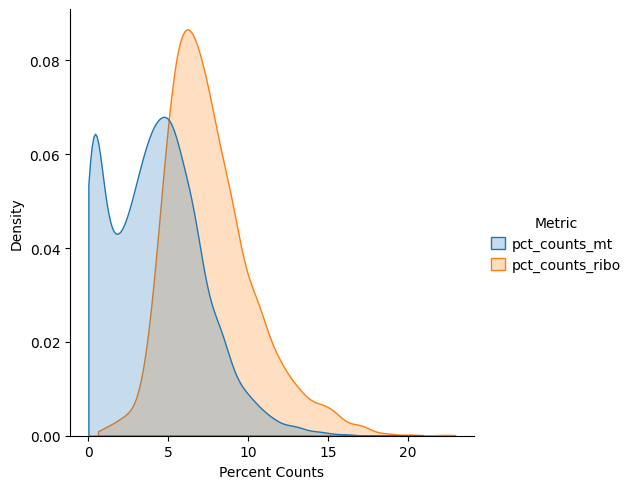

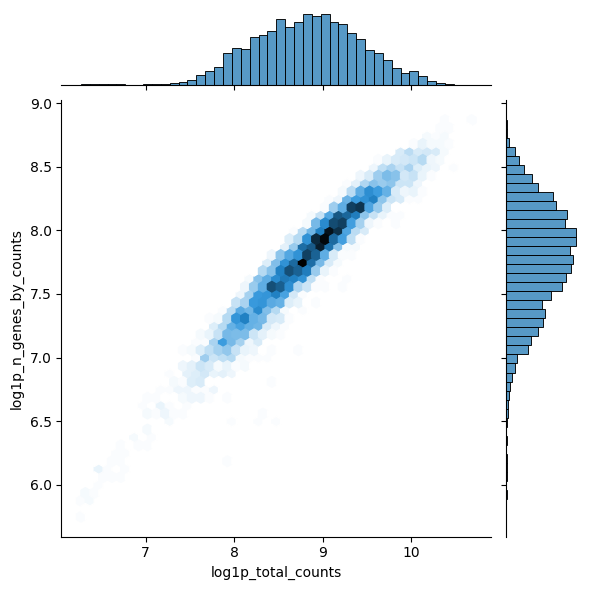

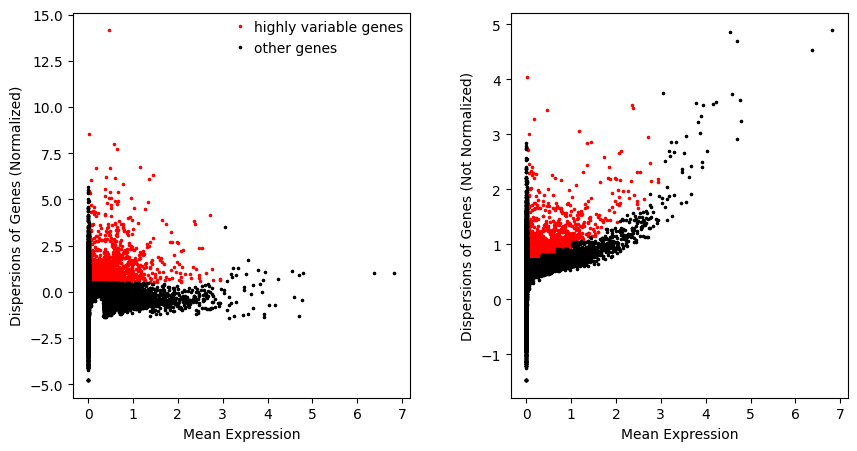


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 4577

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              94.669236   
50%                5.0     0.001070           0.001070              99.892957   
75%              249.0     0.057803           0.056195             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12     0.437935   
50%           5.0            1.791759  1.435551e-03     0.603120   
75%         270.0            5.602119  7.107450e-02     0.747815   

     dispersions_norm      mean       std  
25%         -0.435464  0.000000  0.058486  
50%          0.104956  0.000856  0.331300  
75%          0.491473  0.043058  1.000000  




<<< CLUSTERING HH05 >>>


Un-used Keyword Ar

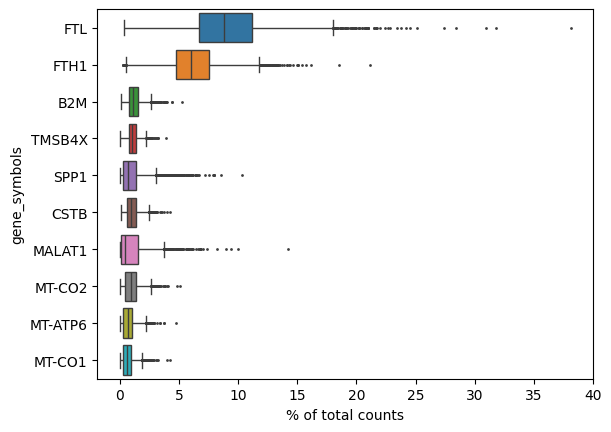



Counts: Initial


	Observations: 4347

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




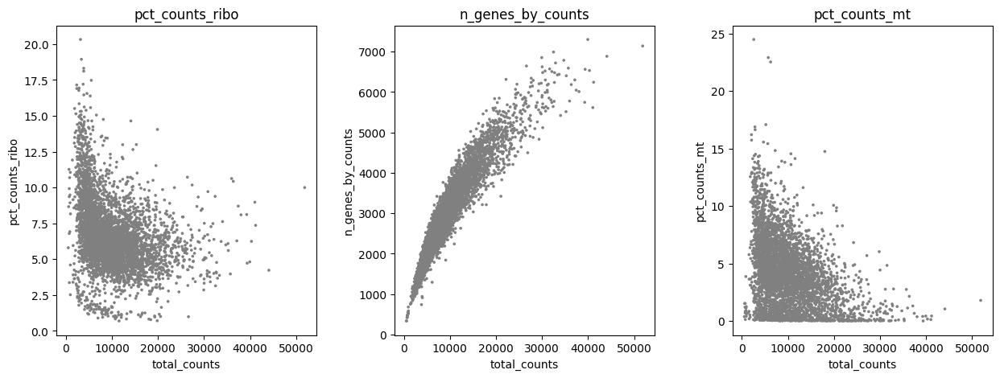


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 4347

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              93.167702   
50%                6.0     0.001380           0.001379              99.861974   
75%              297.0     0.075914           0.073171             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%           6.0            1.945910  
75%         330.0            5.802118  





Counts: Post-`min_cell`


	Observations: 4347

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              93.167702   
50%                6.0     0.001380           0.001379              99.861974   
75%              297.0     0.075914           0.073171             100.00000

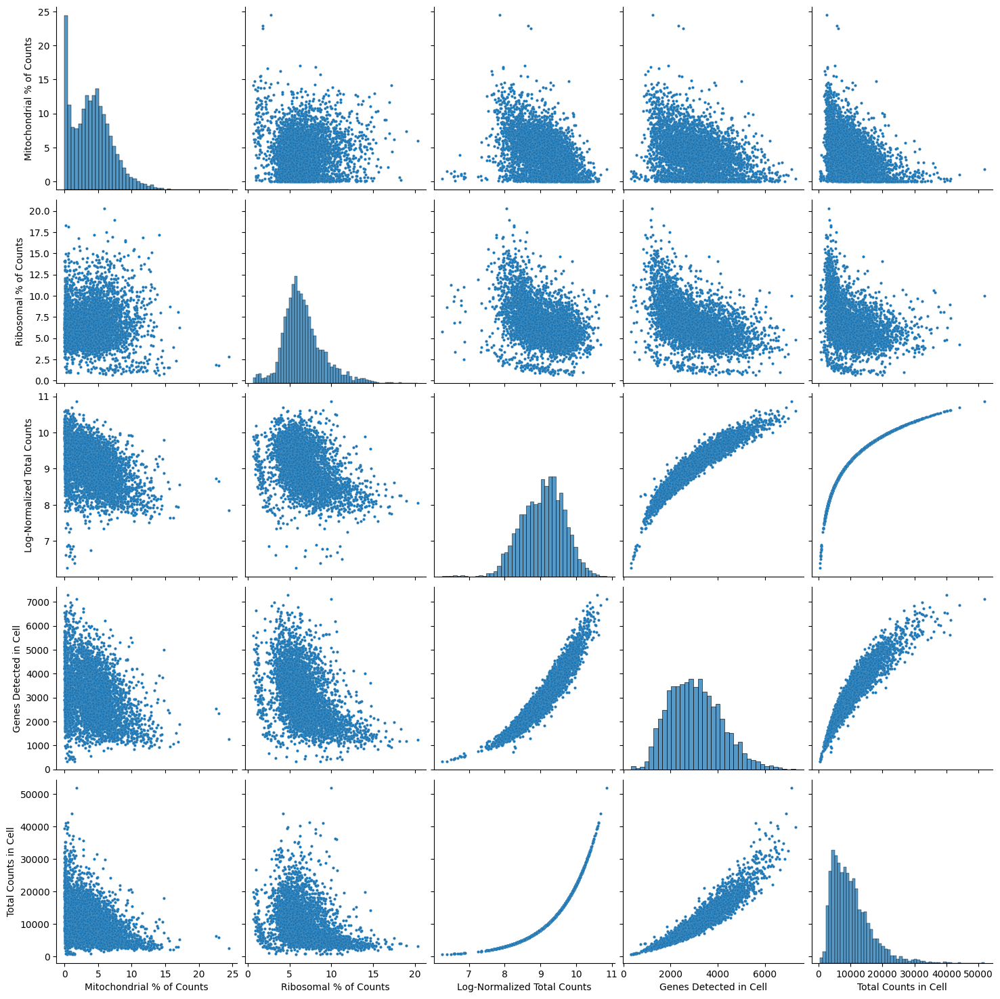

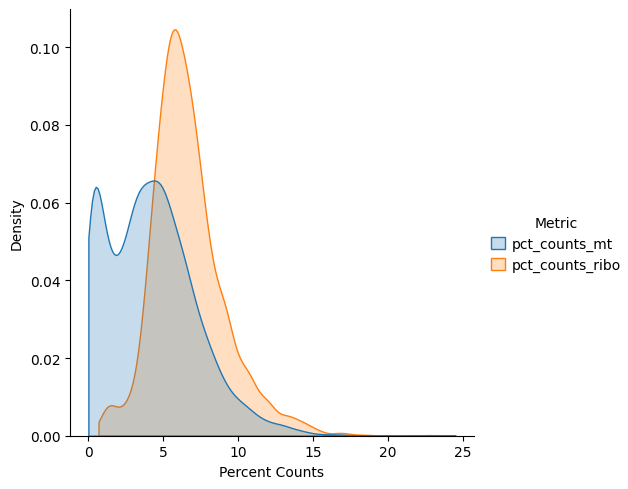

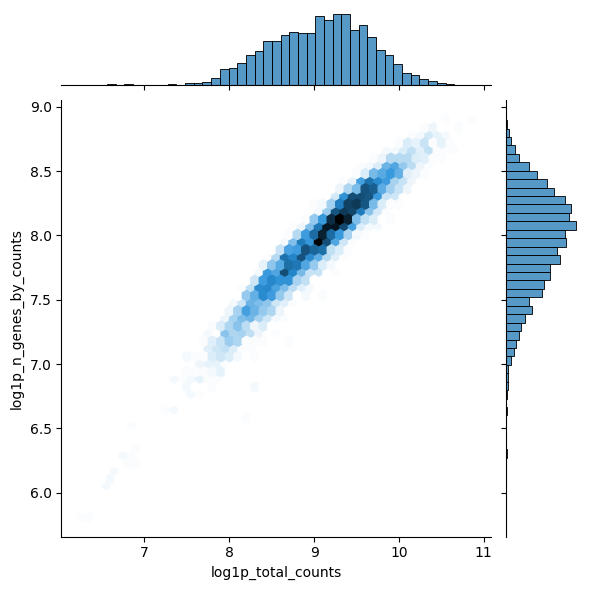

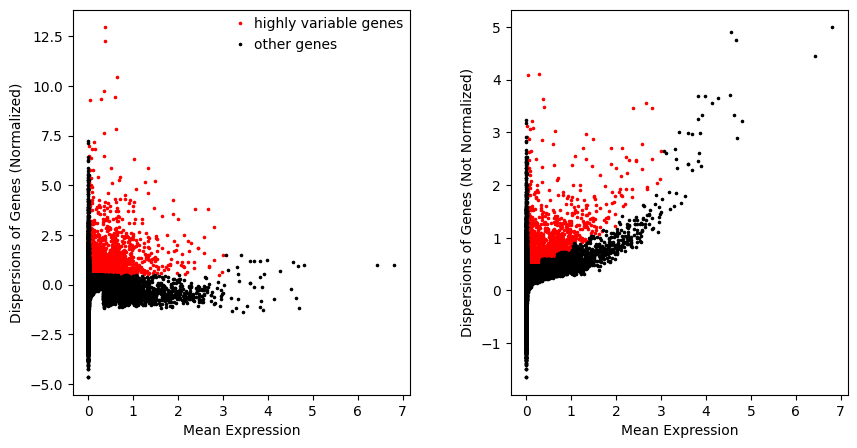


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 4227

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              93.167702   
50%                6.0     0.001380           0.001379              99.861974   
75%              297.0     0.075914           0.073171             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12     0.183172   
50%           6.0            1.945910  1.434177e-03     0.342178   
75%         330.0            5.802118  7.363773e-02     0.489715   

     dispersions_norm      mean       std  
25%         -0.445169  0.000000  0.052062  
50%          0.079314  0.000928  0.310147  
75%          0.450609  0.048391  1.000000  




<<< CLUSTERING HH06 >>>


Un-used Keyword Ar

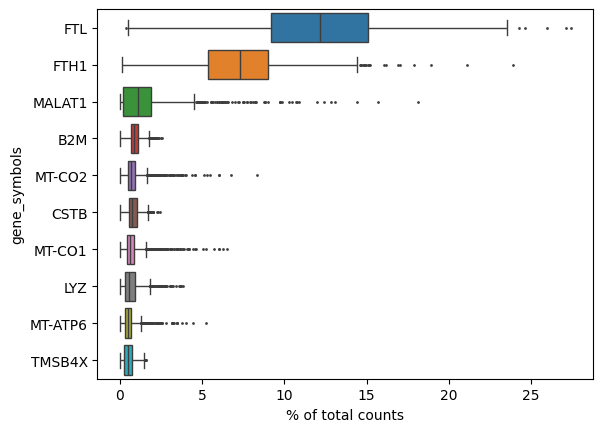



Counts: Initial


	Observations: 1227

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




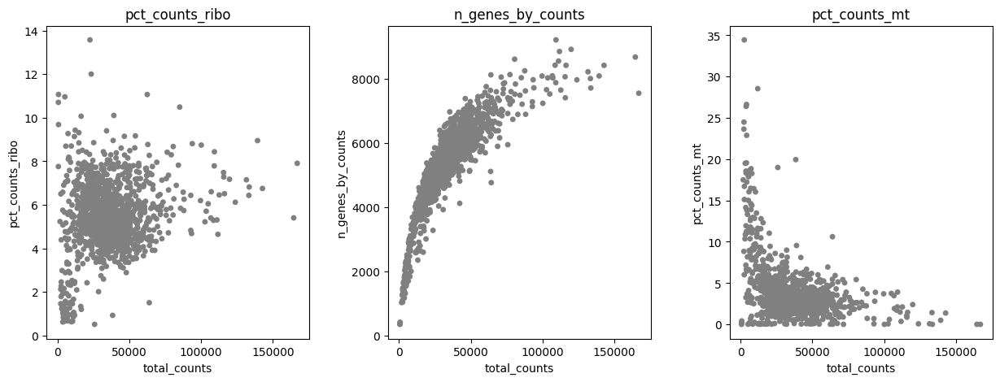


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 1227

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              83.455583   
50%                3.0     0.002445           0.002442              99.755501   
75%              203.0     0.210269           0.190843             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%           3.0            1.386294  
75%         258.0            5.556828  





Counts: Post-`min_cell`


	Observations: 1227

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              83.455583   
50%                3.0     0.002445           0.002442              99.755501   
75%              203.0     0.210269           0.190843             100.00000

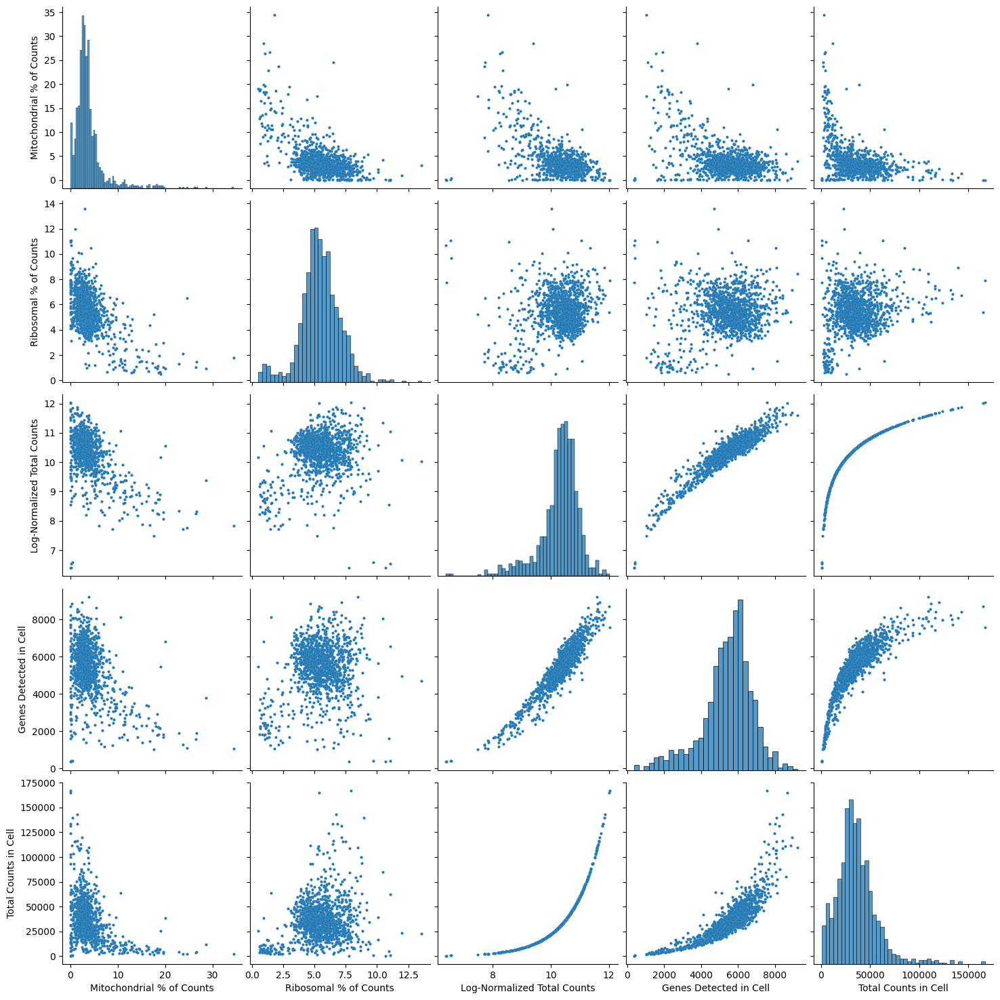

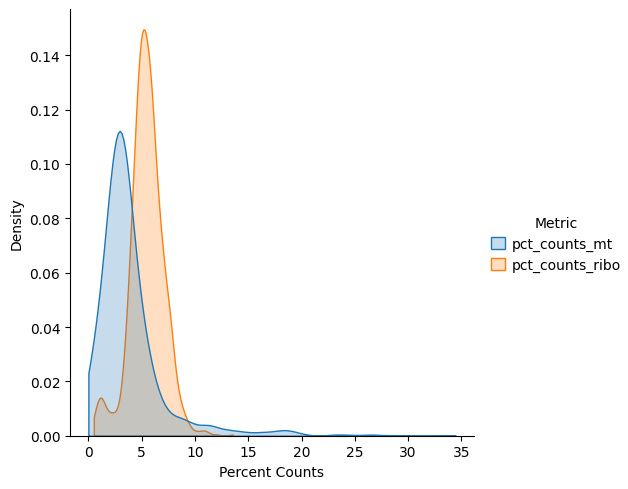

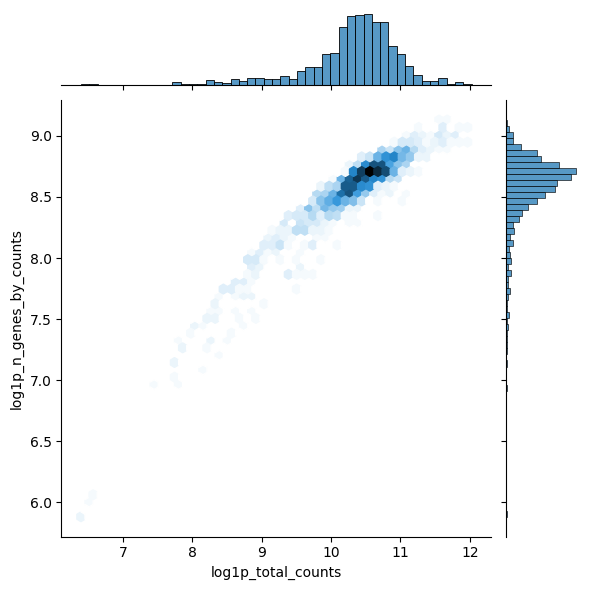

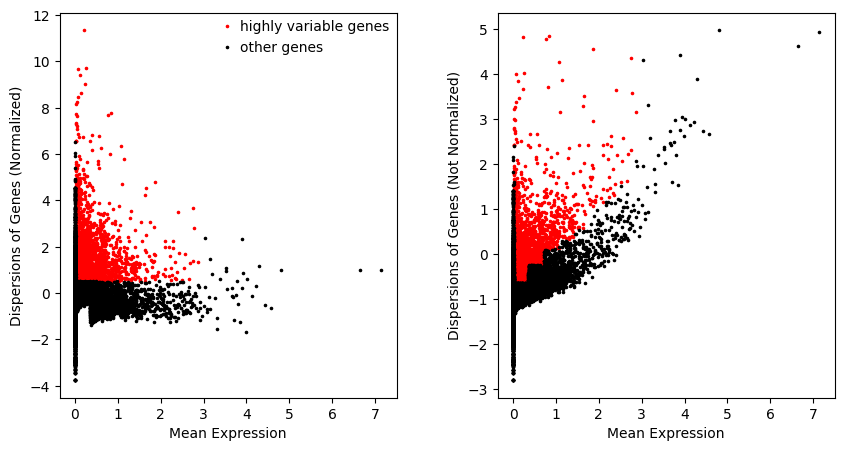


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 1132

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              83.455583   
50%                3.0     0.002445           0.002442              99.755501   
75%              203.0     0.210269           0.190843             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12    -1.117162   
50%           3.0            1.386294  8.274562e-04    -0.896077   
75%         258.0            5.556828  5.841073e-02    -0.613412   

     dispersions_norm      mean       std  
25%         -0.546527  0.000000  0.046801  
50%         -0.106260  0.000710  0.261288  
75%          0.388330  0.048986  1.000000  




<<< CLUSTERING HH07 >>>


Un-used Keyword Ar

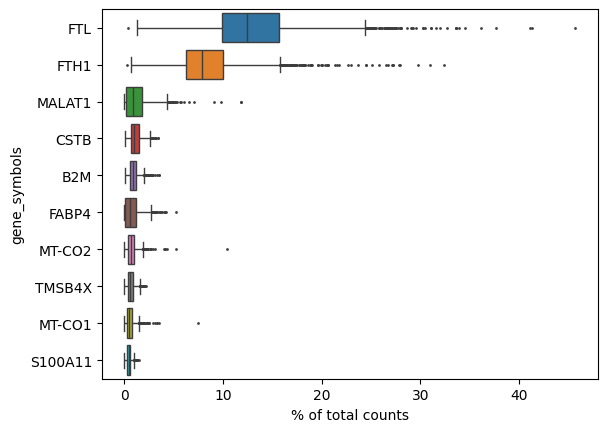



Counts: Initial


	Observations: 3300

	Genes: 36601





<<< PERFORMING QUALITY CONTROL ANALYSIS>>>

	*** Detecting Mitochondrial, Ribosomal, Hemoglobin genes...

	*** Calculating & plotting QC metrics...




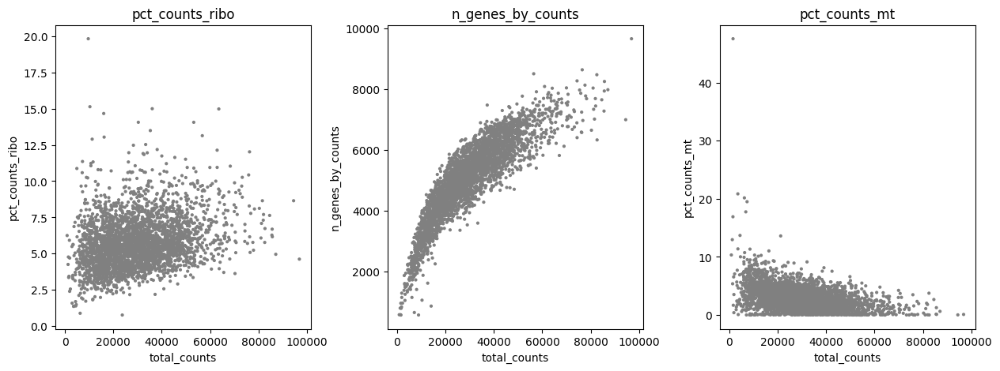


<<< FILTERING CELLS (TOO FEW GENES) & GENES (TOO FEW CELLS) >>>


Counts: Post-`min_gene`


	Observations: 3300

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              85.030303   
50%               10.0     0.003030           0.003026              99.696970   
75%              494.0     0.186667           0.171148             100.000000   

     total_counts  log1p_total_counts  
25%           0.0            0.000000  
50%          10.0            2.397895  
75%         616.0            6.424869  





Counts: Post-`min_cell`


	Observations: 3300

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              85.030303   
50%               10.0     0.003030           0.003026              99.696970   
75%              494.0     0.186667           0.171148             100.00000

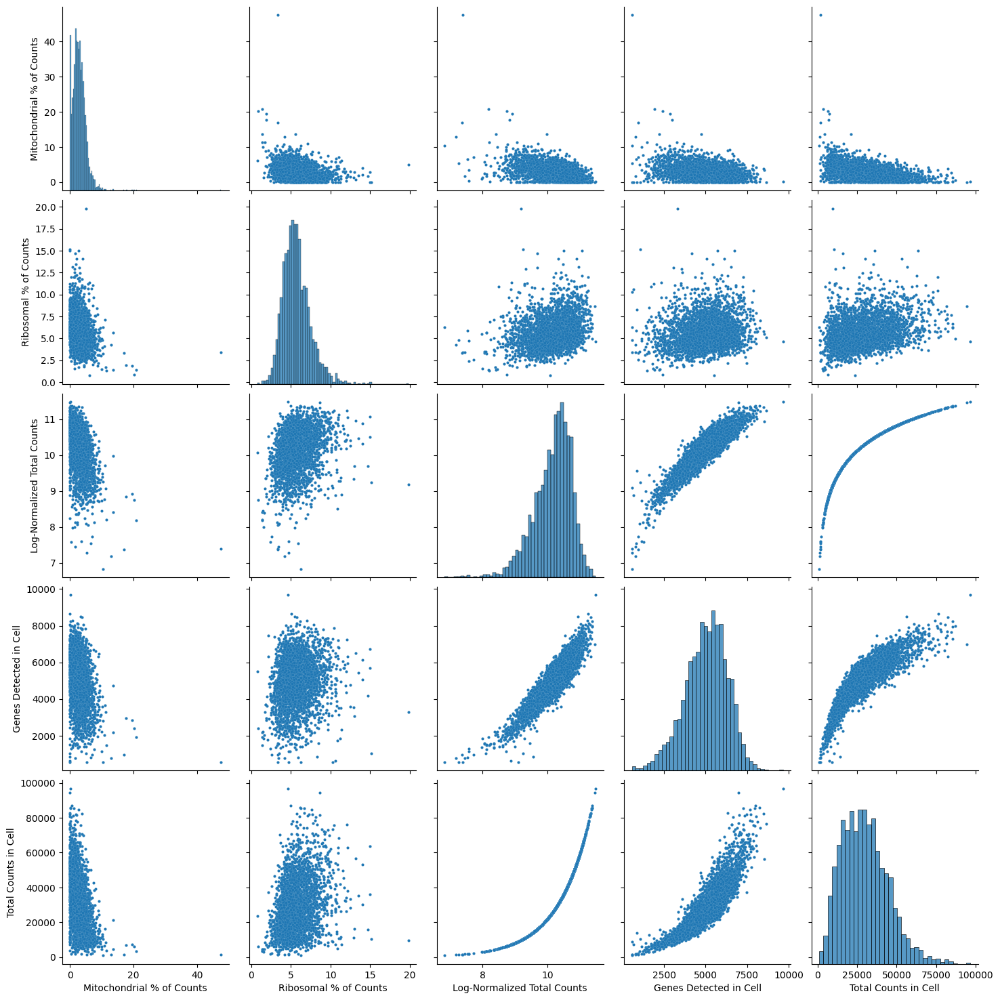

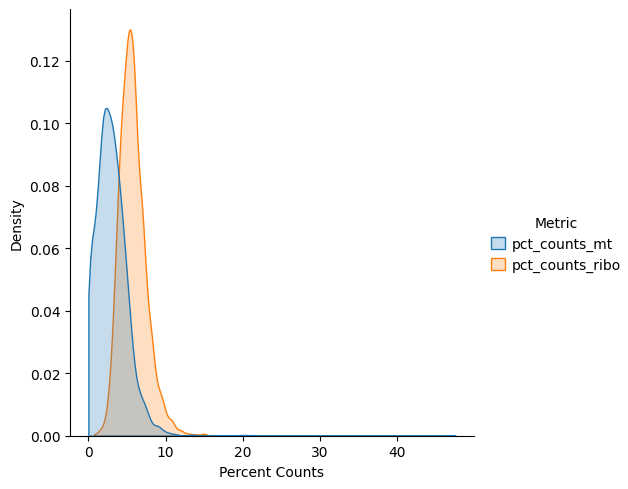

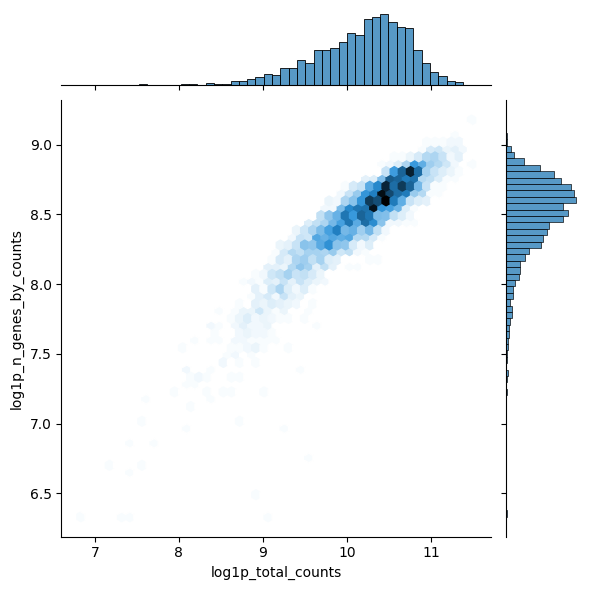

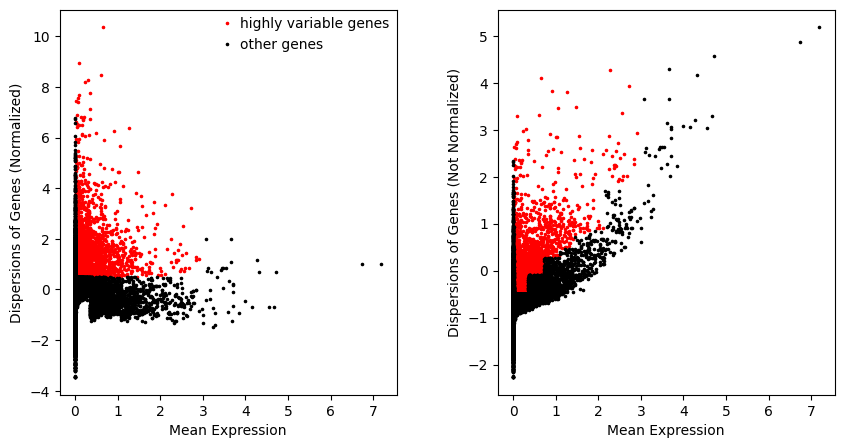


<<< NORMALIZING RAW GENE EXPRESSION >>>

	*** Scaling gene expression...

	*** Scaling => `.X` & scaled layer...


Counts: Post-Processing


	Observations: 3231

	Genes: 36601

     n_cells_by_counts  mean_counts  log1p_mean_counts  pct_dropout_by_counts  \
25%                0.0     0.000000           0.000000              85.030303   
50%               10.0     0.003030           0.003026              99.696970   
75%              494.0     0.186667           0.171148             100.000000   

     total_counts  log1p_total_counts         means  dispersions  \
25%           0.0            0.000000  1.000000e-12    -0.884996   
50%          10.0            2.397895  1.082522e-03    -0.668414   
75%         616.0            6.424869  6.298277e-02    -0.431596   

     dispersions_norm      mean       std  
25%         -0.558381  0.000000  0.028077  
50%         -0.030809  0.000887  0.194612  
75%          0.448900  0.050898  1.000000  




<<< CLUSTERING HH09 >>>


Un-used Keyword Ar

2024-10-02 14:47:06,715 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...



<<< INTEGRATING WITH HARMONY >>>


2024-10-02 14:47:10,558 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2024-10-02 14:47:10,672 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2024-10-02 14:47:19,965 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2024-10-02 14:47:29,053 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2024-10-02 14:47:36,572 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2024-10-02 14:47:41,709 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2024-10-02 14:47:46,994 - harmonypy - INFO - Iteration 6 of 10
Iteration 6 of 10
2024-10-02 14:47:50,847 - harmonypy - INFO - Iteration 7 of 10
Iteration 7 of 10
2024-10-02 14:47:54,189 - harmonypy - INFO - Iteration 8 of 10
Iteration 8 of 10
2024-10-02 14:47:57,790 - harmonypy - INFO - Converged after 8 iterations
Converged after 8 iterations





 AnnData object with n_obs × n_vars = 22798 × 36601
    obs: 'feature_call', 'feature_call_processed', 'feature_split', 'guide_split', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'log1p_total_counts_ribo', 'log_counts', 'n_genes', 'n_genes_by_counts', 'n_obs_raw', 'num_features', 'num_umis', 'num_umis_original', 'num_umis_processed', 'percent_umis', 'perturbation', 'target_gene', 'total_counts', 'total_counts_mt', 'total_counts_ribo', 'total_umis_cell', 'pct_counts_mt', 'pct_counts_ribo', 'n_counts', 'outlier_pct_counts_mt_threshold', 'outlier_pct_counts_ribo_threshold', 'outlier_n_counts_threshold', 'outlier', 'assay_protein', 'col_gene_symbols', 'col_cell_type', 'col_sample_id', 'col_batch', 'col_subject', 'col_condition', 'col_num_umis', 'kws_hvg', 'target_sum', 'regress_out', 'outlier_mads', 'cell_filter_ngene', 'gene_filter_n_cell', 'kws_scale', 'leiden', 'sample'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts-HH03', '

In [2]:
self = cr.Crispr(files, **kwargs_init, kws_multi=dict(
    kws_pp=kws_pp, kws_cluster=kws_cluster, kws_harmony=True))

## Add Metadata

In [3]:
self.rna.obs = self.rna.obs.join(pd.DataFrame(ids).T.rename_axis(
    self._columns["col_sample_id"]), on=self._columns["col_sample_id"])

## Clustering, DEGs/Markers, and Annotation

For more details, see the "Single Cell" tutorial.



`kws_pca`=False. Using existing if present:

AnnData object with n_obs × n_vars = 22798 × 36601
    obs: 'feature_call', 'feature_call_processed', 'feature_split', 'guide_split', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'log1p_total_counts_ribo', 'log_counts', 'n_genes', 'n_genes_by_counts', 'n_obs_raw', 'num_features', 'num_umis', 'num_umis_original', 'num_umis_processed', 'percent_umis', 'perturbation', 'target_gene', 'total_counts', 'total_counts_mt', 'total_counts_ribo', 'total_umis_cell', 'pct_counts_mt', 'pct_counts_ribo', 'n_counts', 'outlier_pct_counts_mt_threshold', 'outlier_pct_counts_ribo_threshold', 'outlier_n_counts_threshold', 'outlier', 'assay_protein', 'col_gene_symbols', 'col_cell_type', 'col_sample_id', 'col_batch', 'col_subject', 'col_condition', 'col_num_umis', 'kws_hvg', 'target_sum', 'regress_out', 'outlier_mads', 'cell_filter_ngene', 'gene_filter_n_cell', 'kws_scale', 'leiden', 'sample', 'perturbed', 'MDP', 'Oxia', 'subject'
   

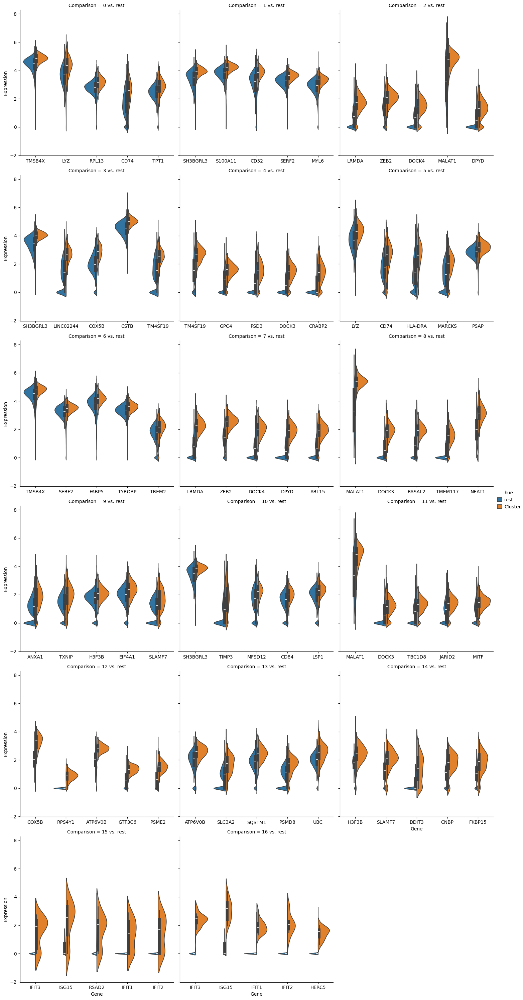

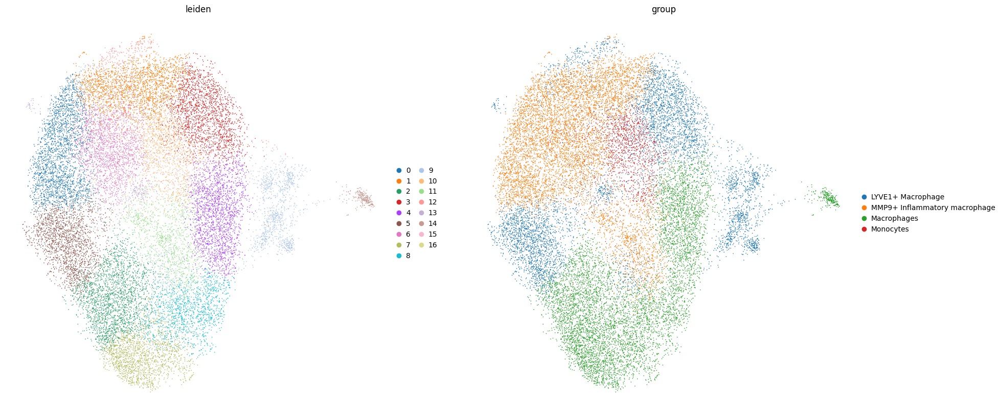

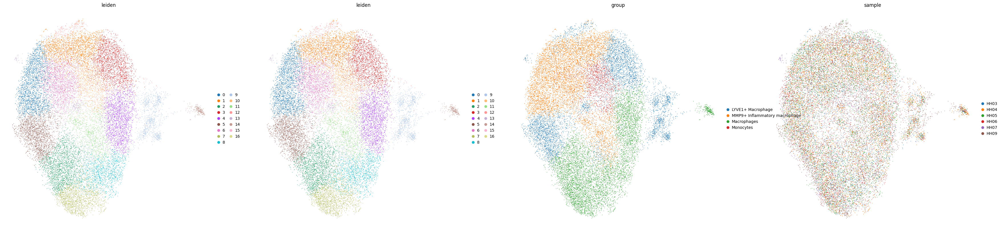

CPU times: user 10min 6s, sys: 8min 32s, total: 18min 38s
Wall time: 5min 22s


In [4]:
%%time

self.cluster(**kws_cluster)  # clustering
marks, figs_m = self.find_markers(n_genes=20)  # DEGs/cluster markers
_ = self.annotate_clusters(assign, col_annotation=col_annotation)
self.plot_umap(["leiden", col_annotation, self._columns["col_sample_id"]])
self._columns["col_cell_type"] = col_annotation  # new default

## Gene Expression Plots


<<< PLOTTING GEX (Heatmap) >>>

<<< PLOTTING GEX (Dot) >>>


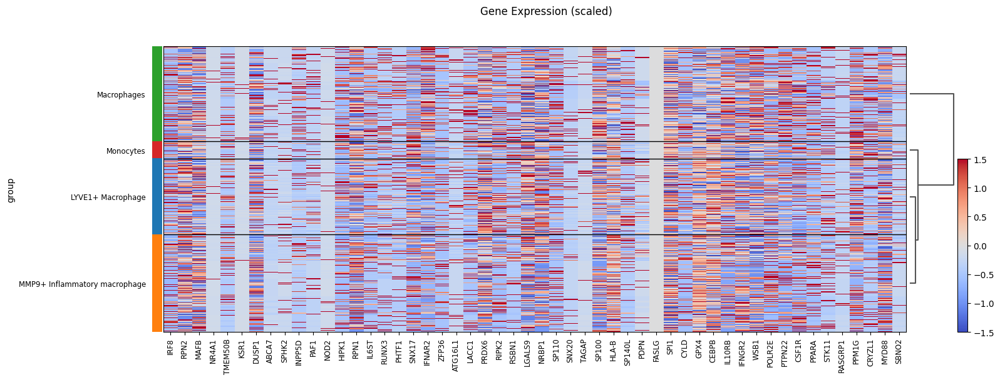

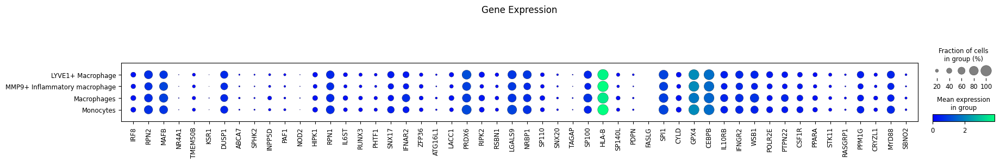

In [5]:
figs = self.plot(self.adata.obs[self._columns["col_target_genes"]].unique(),
                 kind=["heat", "dot"], layer="scaled",
                 kws_heat=dict(vmin=-1.5, vmax=1.5))

## CRISPR Analyses

Perform downstream CRISPR analyses.

Remember that parameters like `col_cell_type`, `col_condition`, `col_perturbed`, `col_target_genes`, `key_treatment`, and `key_control` are, by default, pulled from `self._columns` and `self._keys`; however, you can override the defaults by passing the appropriate arguments to the methods below (e.g., `self.run_augur(col_cell_type="leiden", ...)`)

### Targeting Efficiency

This example calculates targeting efficiency for each target versus all other perturbations and control. 

**You can specify any list of perturbations to use as a reference group** by passing the argument `key_compare`. Thus, to use just control as a reference group, use the following code:
```python
targ_eff = self.calculate_targeting_efficiency(
    key_compare=[self._keys["key_control"]], plot=False)
```

**To compare both methods, see code in the following dropdown.**

<details>
  <summary>Reference Group Comparison</summary>

  ```python
kde_a = self.calculate_targeting_efficiency(plot=False)
kde_c = self.calculate_targeting_efficiency(
    key_compare=[self._keys["key_control"]], plot=False)  # versus control
kde = pd.concat([kde_a, kde_c], keys=[
    "Versus All Other", "Versus Control"], names=["Reference Group"])
print(kde["Targeting Efficiency"].groupby("Reference Group").describe())
fig = sb.catplot(kde, x=self._columns["col_condition"],
                 y="Targeting Efficiency", hue="Reference Group",
                 height=20, kind="bar")
fig.fig.suptitle("Targeting Efficiency")
fig.set_xticklabels(rotation=90)
  ```

</details>

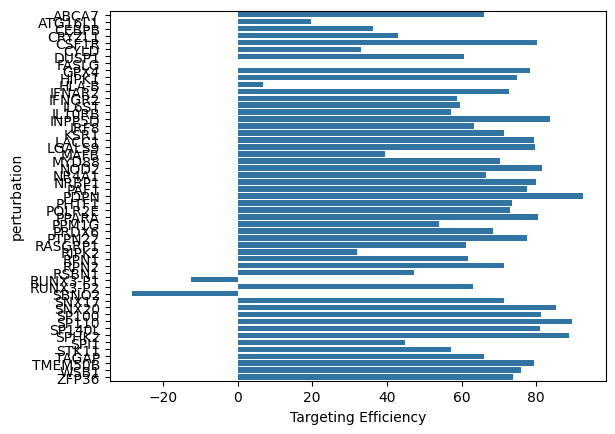

In [6]:
targ_eff = self.calculate_targeting_efficiency()

### Distance Metrics

Compute distance scores comparing gene expression profiles across perturbation conditions. Certain measures can also test whether two profiles came from the same distribution.

This analysis can also be helpful in identifying if a perturbation/condition had a significant effect.

See the `pertpy` [tutorials here](https://pertpy.readthedocs.io/en/latest/tutorials/notebooks/distances.html) and [here](https://pertpy.readthedocs.io/en/latest/tutorials/notebooks/distance_tests.html).

The below example is for a particular distance measure. See a complete [list of available metrics here](https://pertpy.readthedocs.io/en/latest/usage/tools/pertpy.tools.Distance.html#pertpy.tools.Distance) that can be passed to the `distance_type` argument.

Output()

Output()

Output()

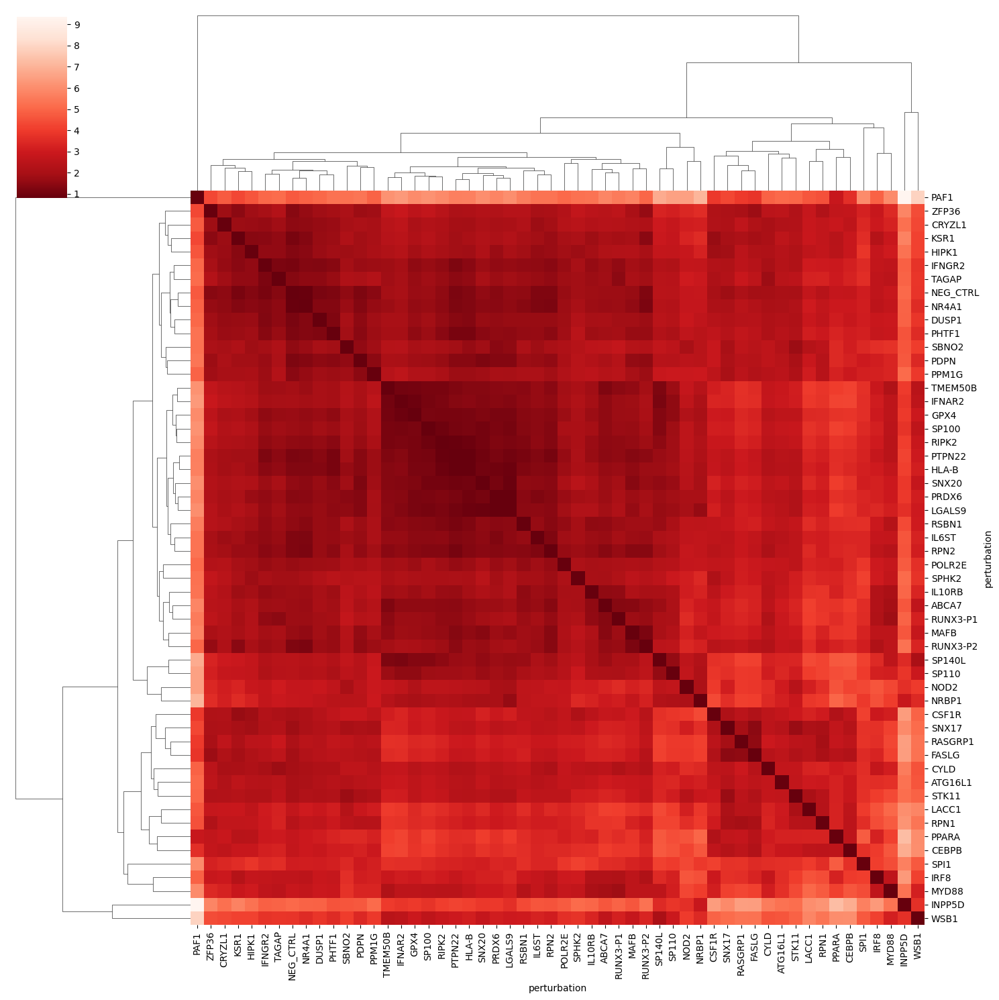

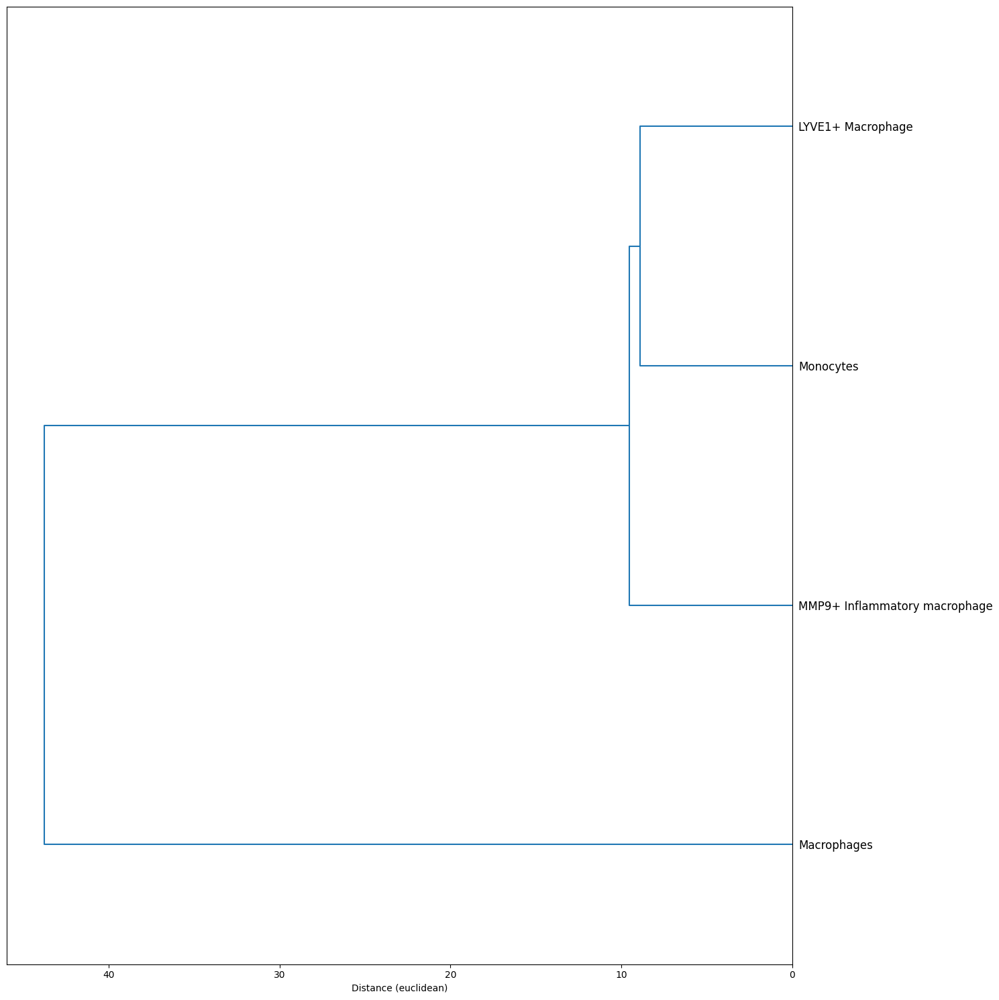

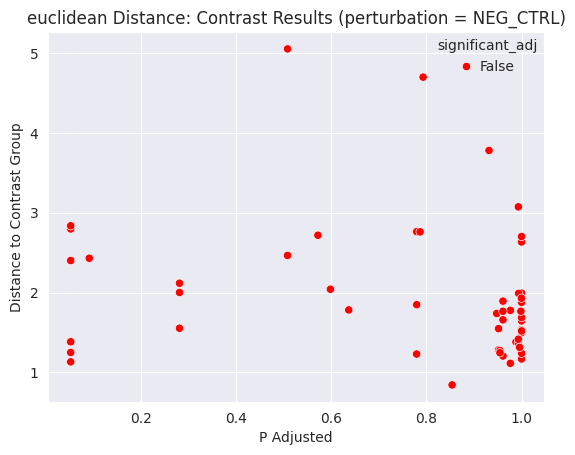

CPU times: user 2min 3s, sys: 2.51 s, total: 2min 5s
Wall time: 2min 3s


In [7]:
%%time

_ = self.compute_distance(distance_type="euclidean", method="X_pca",
                          col_condition=self._columns["col_condition"],
                          kws_plot=dict(figsize=(15, 15), robust=False))

### Identify Perturbation Escapees (Mixscape)


See the `pertpy` [tutorial here](https://pertpy.readthedocs.io/en/latest/tutorials/notebooks/mixscape.html). It gives useful explanations of the process and how to interpret output.

**Is a perturbed cell detectibly perturbed, and to what extent?** 
* Mixscape first calculates the "**perturbation signature**" by determining which control condition cells most closely resemble each perturbed cell in terms of mRNA expression and then subtracts the control expression from that of the perturbed cells' (i.e., centers perturbed cells' gene expression on their control neighbors).
* Then, it **identifies** and removes perturbed **cells with no detectible perturbation** (i.e., assigns them to predicted classes of perturbed versus not perturbed). 
* You can then create visuals based on whether the cell is detectibly perturbed, "non-perturbed" (not detectibly perturbed), or control (no treatment). 
* Optionally, you can visualize protein expression by this predicted class in certain multi-modal data.

**Are there perturbation-specific clusters?** 
* Mixscape uses linear discriminant analysis (LDA) to cluster cells that resemble each other in terms of gene expression and perturbation condition. 
* _(LDA reduces dimensionality and attempts to maximize the separability of classes. Unperturbed cells are removed from analysis.)_ 

<u> __Features__ </u>  

- Plot targeting efficiency.
- Remove confounds (e.g., cell cycle, batch effects)
- Classify cells as affected or unaffected (i.e., "escapees") by the perturbation
- Quantify and visualize degree of perturbation response

If you want to `re-create mixscape plots` **with <u> different target genes and/or proteins of interest**</u> later, you can use `self.plot_mixscape(<ONE OR MORE TARGET GENES>)` without having to re-run Mixscape. If you want a different color for the perturbation score curves, specify `color=` in that method.

```python
_ = self.plot_mixscape(new_list_of_genes, color="red")
```

<u> __Input__ </u> 

See documentation, but the key arguments are listed here.

* **col_cell_type**: If you want to run using a different cell classification column, (e.g., CellTypist annotations that weren't used for the original `self._columns["col_cell_type"]`), you can specify a different column by passing `col_cell_type=<column name>`.
* **target_gene_idents**: A list of gene symbols to focus on in plots/analyses. Specify as True to include all.
* **layer**: The default layer of data used is "log1p." Remember that Mixscape centers cells on their control neighbors when considering whether to use centered and/or scaled data.

<u> __Output__ </u>  

Tuple, with the Mixscape `anndata` object as the first element and the figures in the second element as a dictionary.

Assuming you store the figures output in a variable `figs_mix`:
- Targeting Efficiency: `figs_mix["targeting_efficiency"]`
- Differential Expression Ordered by Posterior Probabilities: `figs_mix["DEX_ordered_by_ppp_heat"]`
- Posterior Probabilities Violin Plot: `figs_mix["ppp_violin"]`
- Perturbation Scores: `figs_mix["perturbation_score"]`
- Perturbation Clusters (from LDA): `figs_mix["perturbation_clusters"]`

<u> __Notes__ </u>  

- If `._columns["col_sample_id"]` is not None, perturbation scores will by default be calculated and/or plotted taking that into consideration (e.g., biological replicates) unless `col_split_by=False`. That argument can also be set to a different column name explicitly, in which case that specification will be used as the `col_split_by` argument in Pertpy Mixscape functions in place of sample ID.
- If you want to remove perturbation escapees from future analyses, further steps (i.e., modifying `self.rna` by, for instance, assigning `self.rna = adata_pert`) are required. We don't do so here so as to avoid altering the object.

#### Run Mixscape


Un-used Keyword Arguments: {'col_gene_symbols': 'gene_symbols', 'col_cell_type': 'group', 'col_sample_id': 'sample', 'col_batch': 'sample', 'col_subject': None, 'col_condition': 'perturbation', 'col_num_umis': 'num_umis', 'col_guide_split': 'guide_split', 'key_table': None}

<<< CALCULATING PERTURBATION SIGNATURE >>>

<<< RUNNING MIXSCAPE ROUTINE >>>
categories: IL6ST NP, NEG_CTRL
var_group_labels: NEG_CTRL


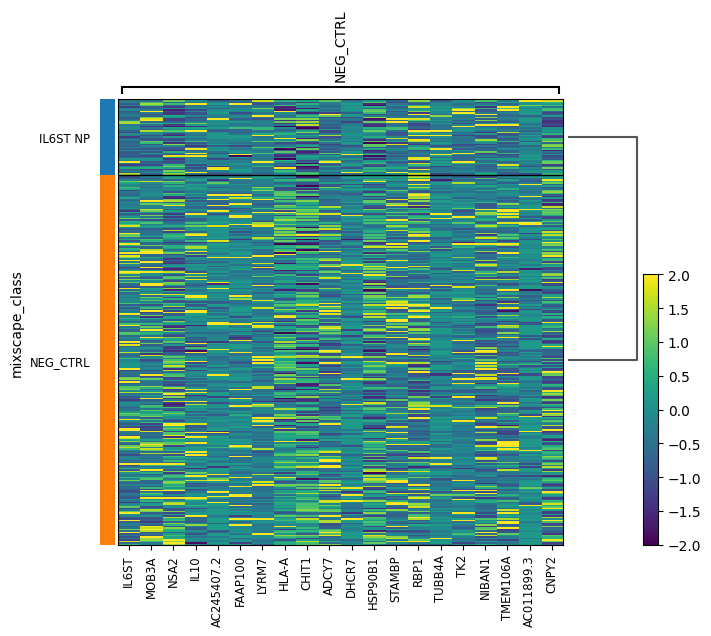

categories: CEBPB KD, CEBPB NP, NEG_CTRL
var_group_labels: NEG_CTRL


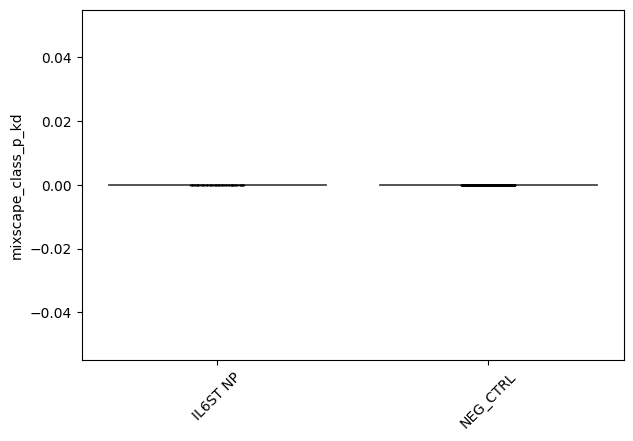

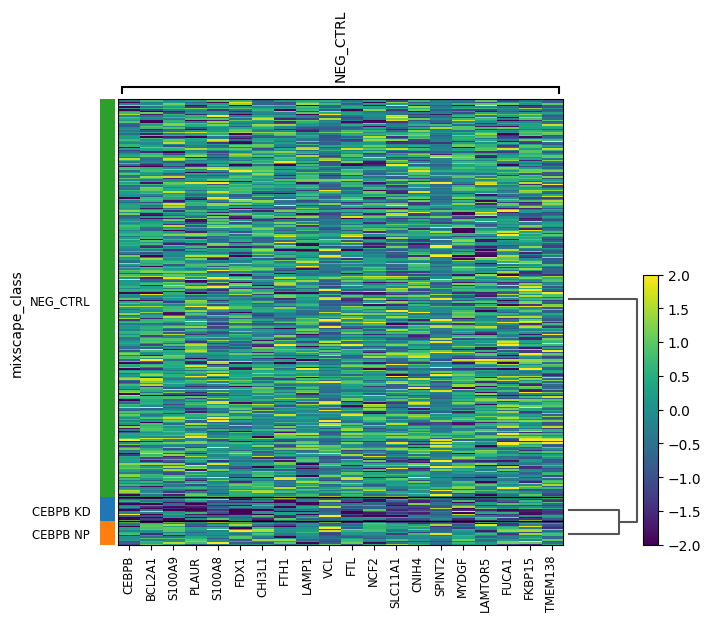

categories: ATG16L1 KD, ATG16L1 NP, NEG_CTRL
var_group_labels: NEG_CTRL


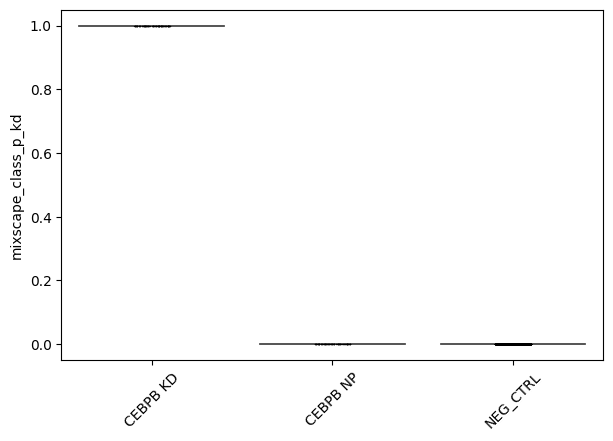

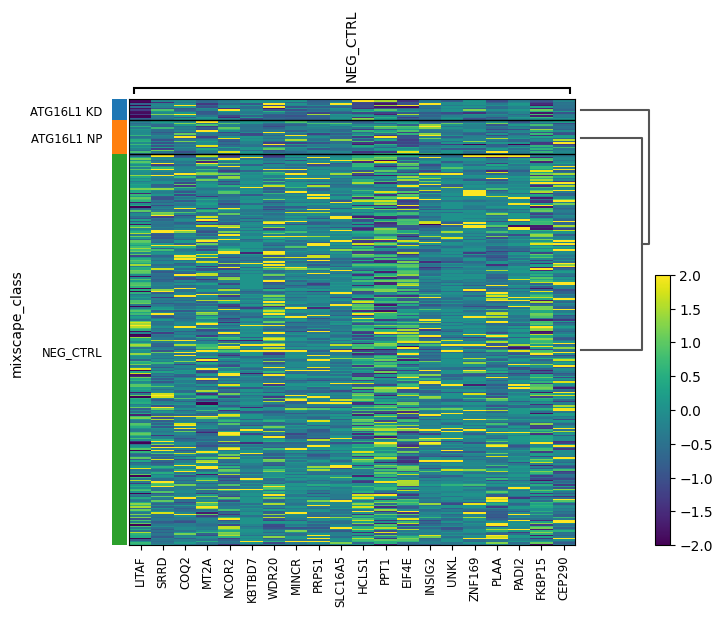

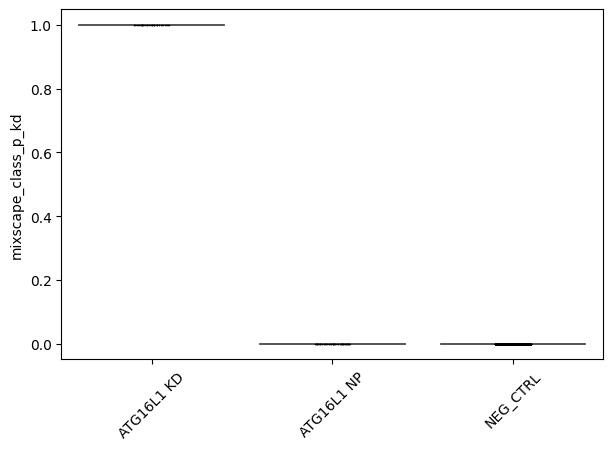

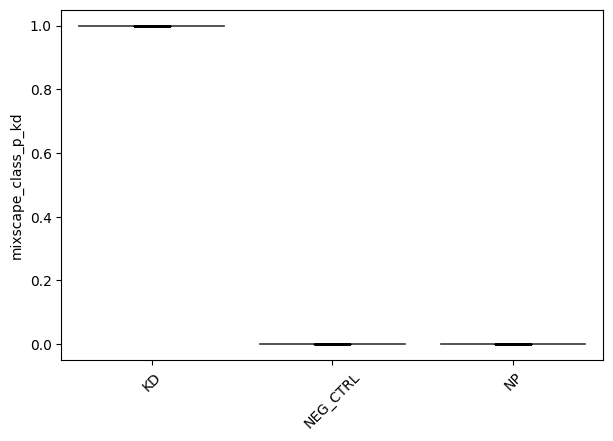

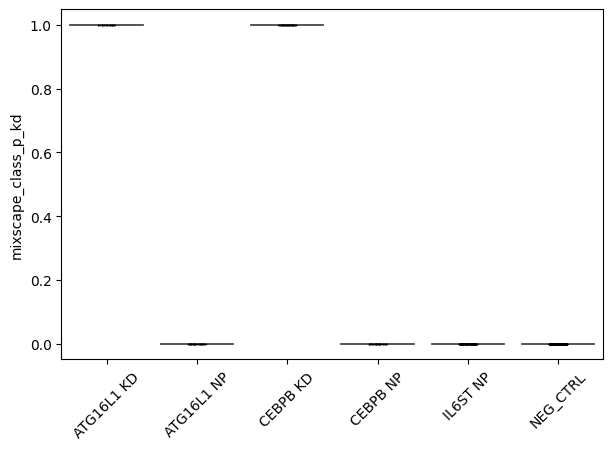

Traceback (most recent call last):
  File "/home/elizabeth/elizabeth/corescpy/corescpy/visualization/perturbation_plots.py", line 130, in plot_mixscape
    figs["perturbation_score"][g] = mix.plot_perturbscore(
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 730, in plot_perturbscore
    for key in adata.uns["mixscape"][target_gene].keys():
KeyError: 'IL6ST'


Axes(0.125,0.11;0.775x0.77)


Traceback (most recent call last):
  File "/home/elizabeth/elizabeth/corescpy/corescpy/visualization/perturbation_plots.py", line 130, in plot_mixscape
    figs["perturbation_score"][g] = mix.plot_perturbscore(
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 795, in plot_perturbscore
    top_r = max(plot_dens.get_lines()[i].get_data()[1].max() for i in range(len(plot_dens.get_lines())))
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 795, in <genexpr>
    top_r = max(plot_dens.get_lines()[i].get_data()[1].max() for i in range(len(plot_dens.get_lines())))
AttributeError: 'list' object has no attribute 'max'




LDA key mixscape_lda not found; skipping LDA plot.



<<< RUNNING LINEAR DISCRIMINANT ANALYSIS (CLUSTERING) >>>
categories: IL6ST NP, NEG_CTRL
var_group_labels: NEG_CTRL


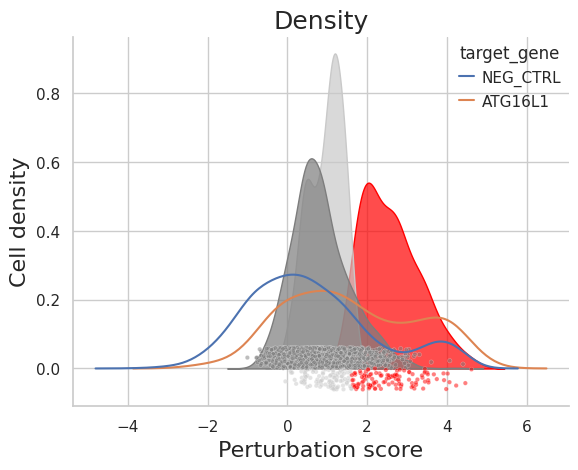

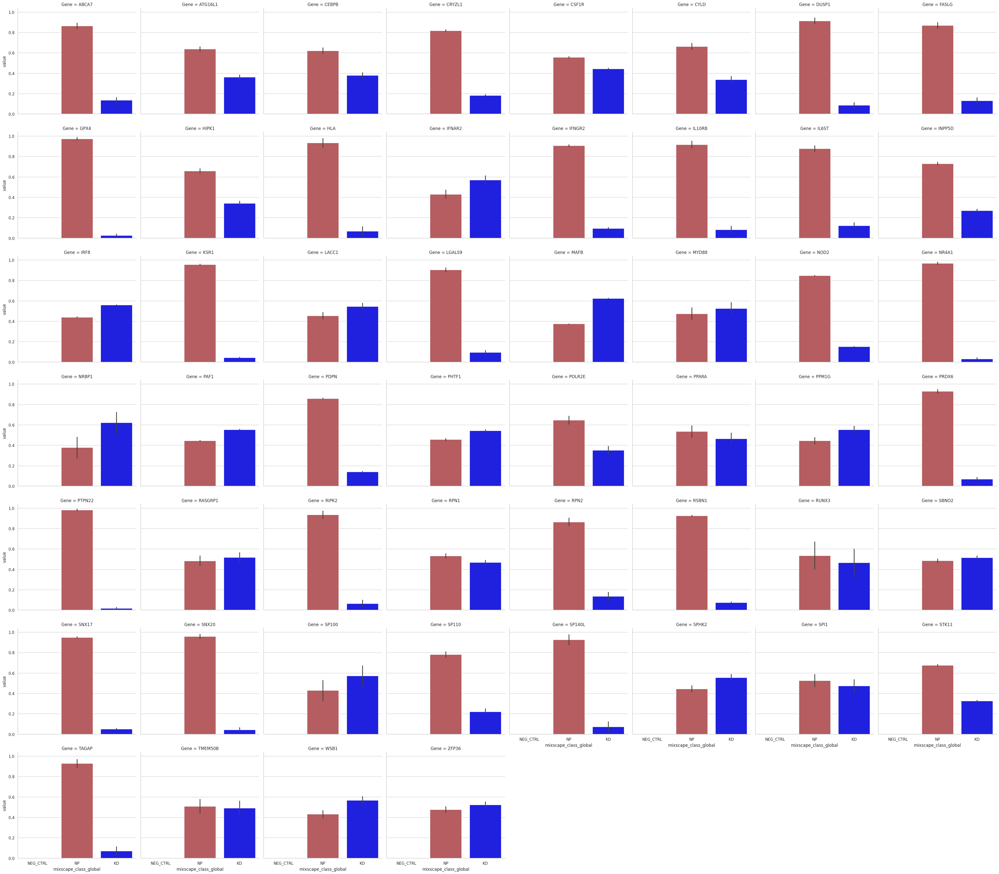

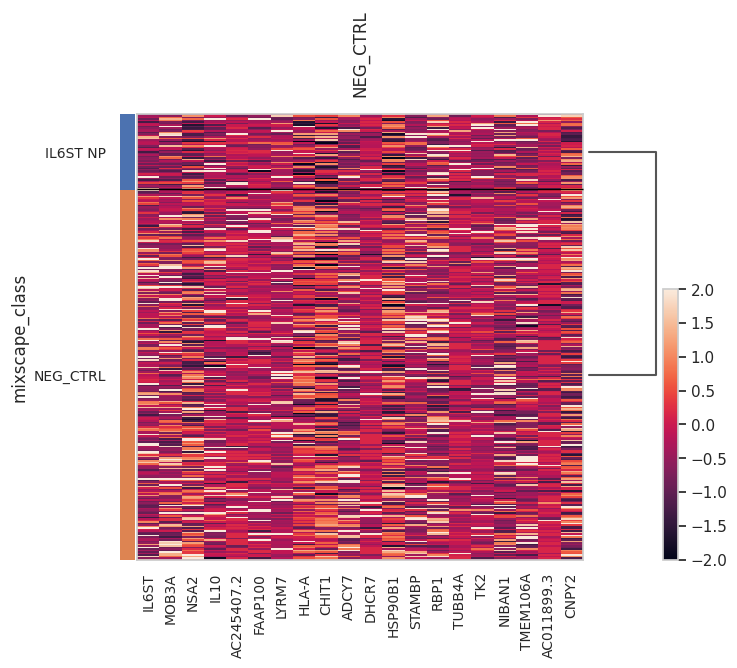

categories: CEBPB KD, CEBPB NP, NEG_CTRL
var_group_labels: NEG_CTRL


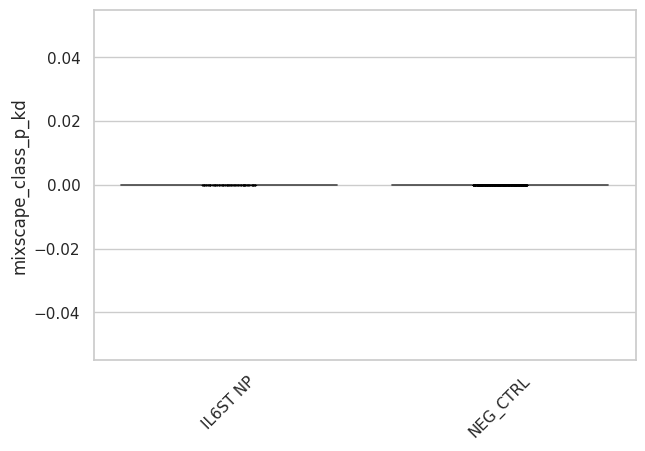

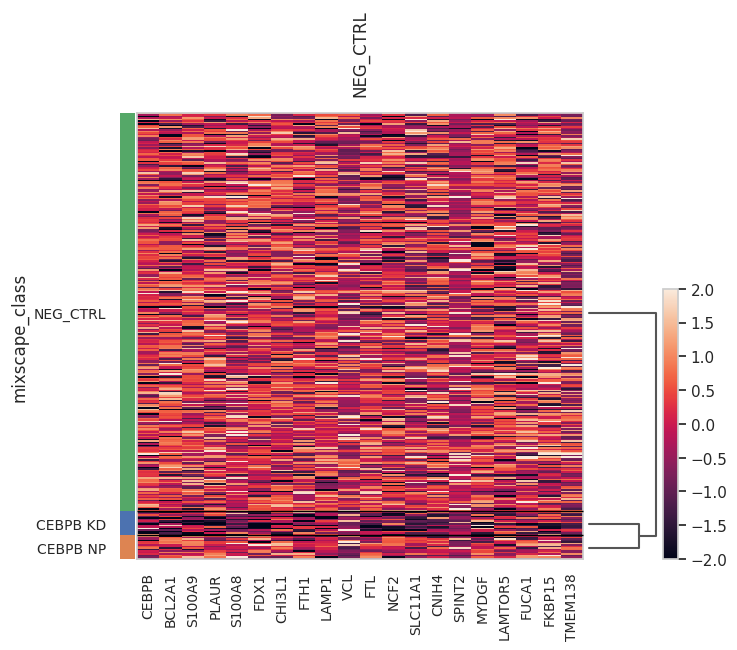

categories: ATG16L1 KD, ATG16L1 NP, NEG_CTRL
var_group_labels: NEG_CTRL


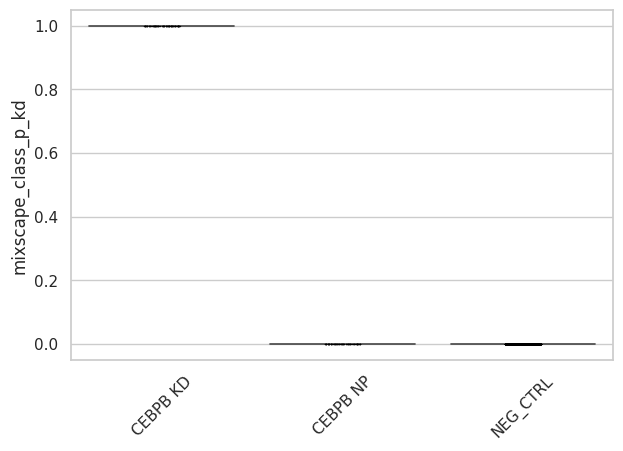

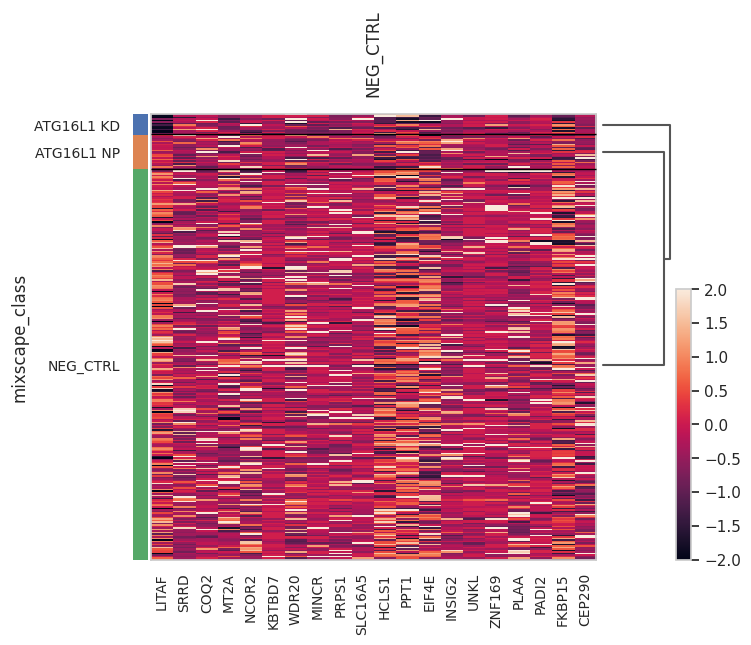

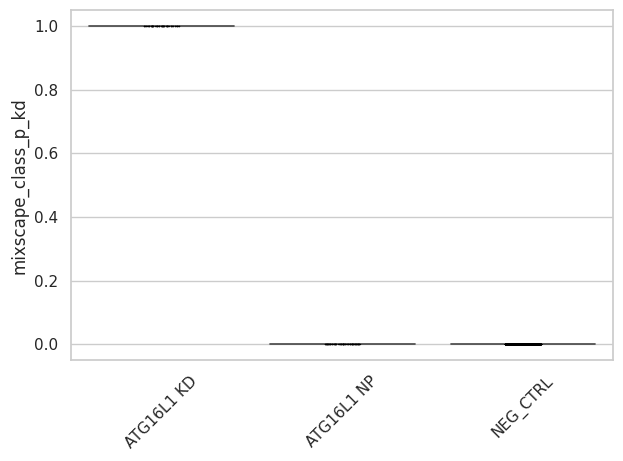

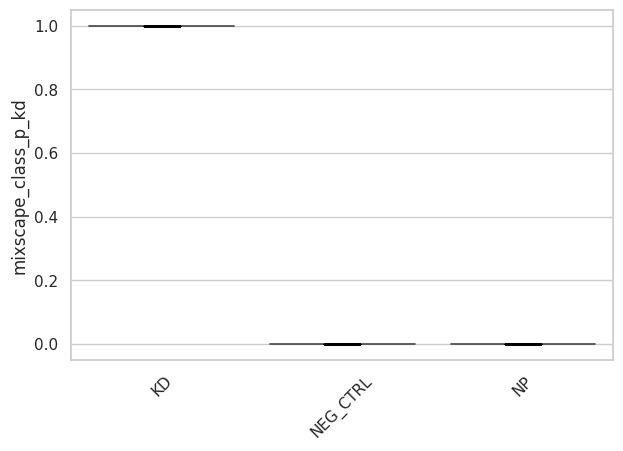

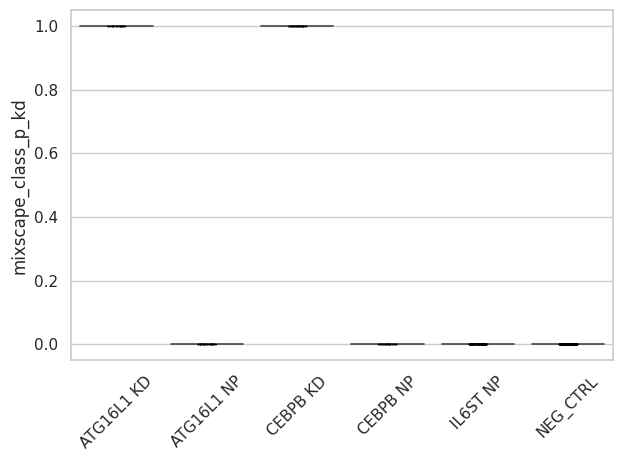

Traceback (most recent call last):
  File "/home/elizabeth/elizabeth/corescpy/corescpy/visualization/perturbation_plots.py", line 130, in plot_mixscape
    figs["perturbation_score"][g] = mix.plot_perturbscore(
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 730, in plot_perturbscore
    for key in adata.uns["mixscape"][target_gene].keys():
KeyError: 'IL6ST'


Axes(0.125,0.11;0.775x0.77)


Traceback (most recent call last):
  File "/home/elizabeth/elizabeth/corescpy/corescpy/visualization/perturbation_plots.py", line 130, in plot_mixscape
    figs["perturbation_score"][g] = mix.plot_perturbscore(
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 795, in plot_perturbscore
    top_r = max(plot_dens.get_lines()[i].get_data()[1].max() for i in range(len(plot_dens.get_lines())))
  File "/home/elizabeth/elizabeth/miniconda3/envs/bio/lib/python3.10/site-packages/pertpy/tools/_mixscape.py", line 795, in <genexpr>
    top_r = max(plot_dens.get_lines()[i].get_data()[1].max() for i in range(len(plot_dens.get_lines())))
AttributeError: 'list' object has no attribute 'max'


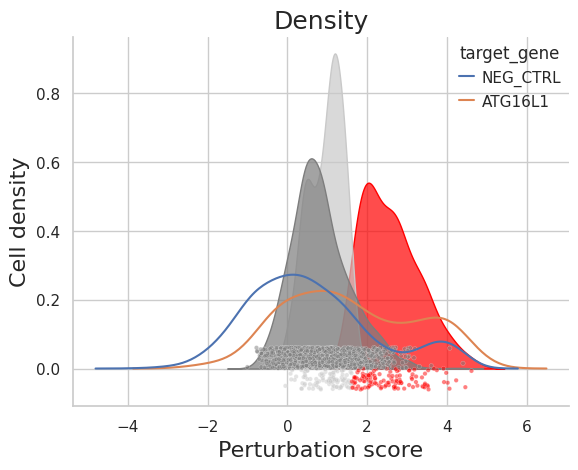

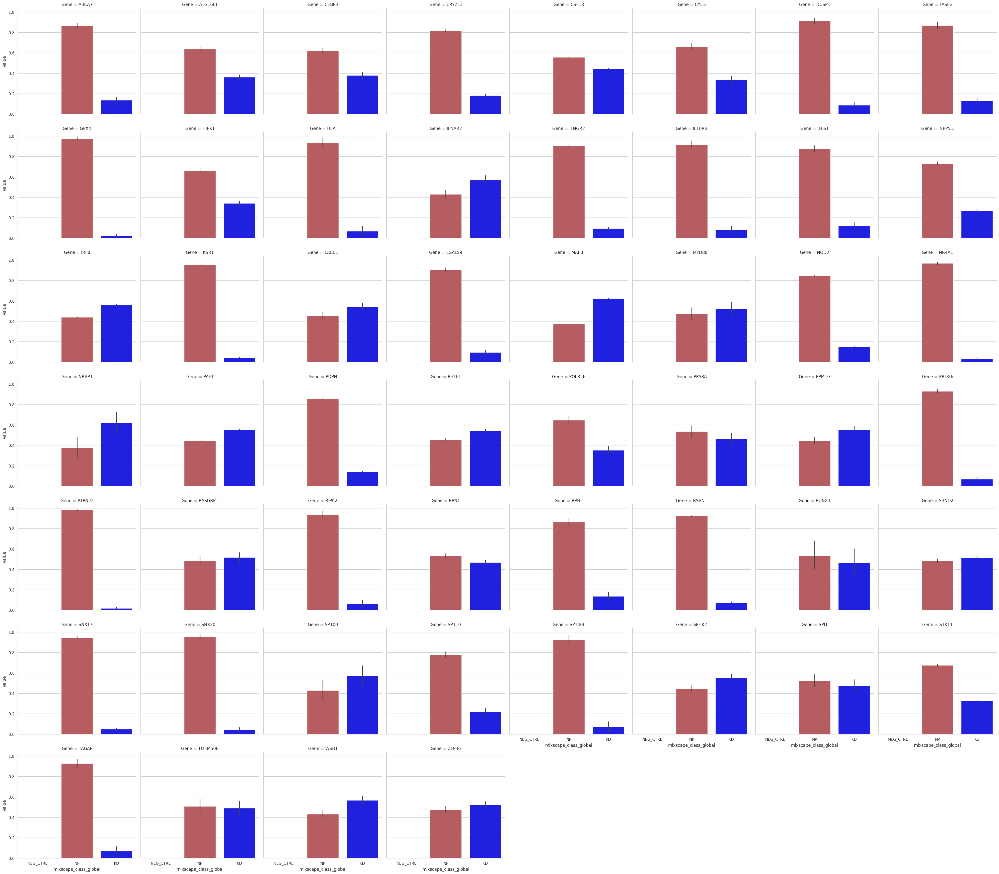

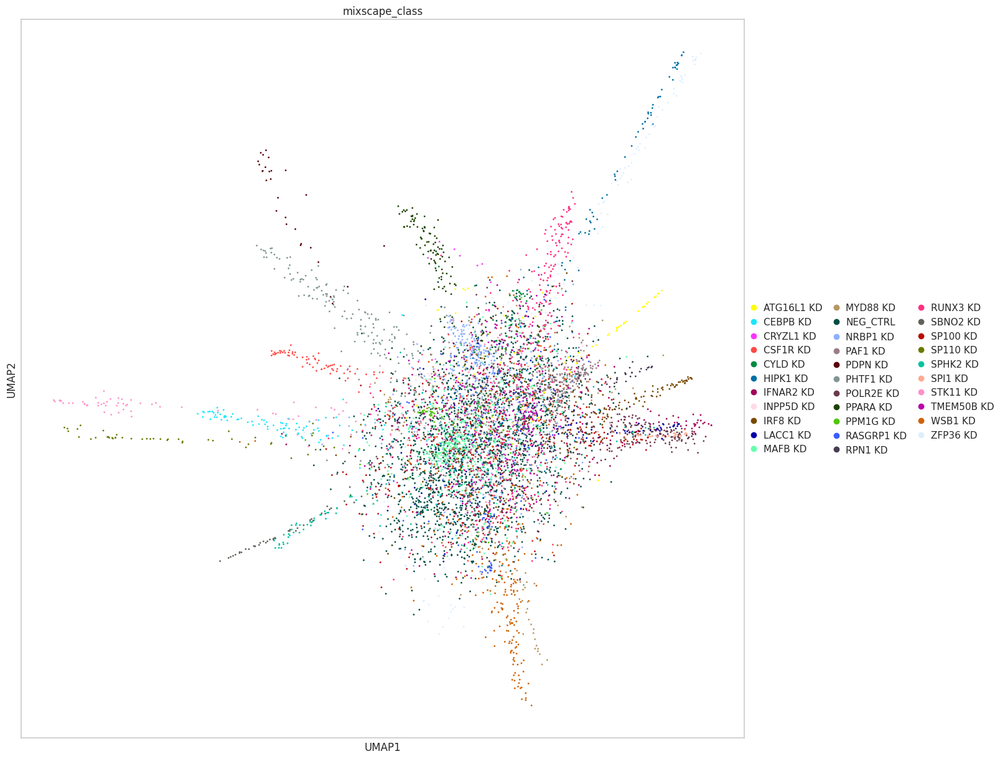

Figure(1500x1500)
'IL6ST'
Axes(0.125,0.11;0.775x0.77)
'list' object has no attribute 'max'
CPU times: user 1h 8min 2s, sys: 45min 23s, total: 1h 53min 25s
Wall time: 10min 55s


In [8]:
%%time

tgis = list(set(genes_of_interest).intersection(self.rna.obs[
    self._columns["col_target_genes"]]))[:2]  # just plot some for brevity
adata_pert, figs_mix = self.run_mixscape(
    target_gene_idents=tgis, col_split_by=False, iter_num=10)

#### Plot Different Target Genes

In [ ]:
tgis = list(set(genes_of_interest).intersection(self.rna.obs[
    self._columns["col_target_genes"]]))[-2:]  # just plot some for brevity
_ = self.plot_mixscape(tgis, color="red")

### Cell Type Perturbation Response (Augur)

**Which cell types are most affected by perturbations?** Quantify perturbation responses by cell type with Augur (see `pertpy` [tutorial here](https://pertpy.readthedocs.io/en/latest/tutorials/notebooks/augur.html)), which uses supervised machine learning classification of experimental condition labels (e.g., treated versus untreated). The more separable the condition among cells of a given type, the higher the perturbation effect score.

<u> __Features__ </u>  

- Quantify and visualize degree of perturbation response by cell type.
- Identify the most important features (genes).

<u> __Input__ </u>  

There are no required arguments. 
* If you want to override defaults drawn from `._columns` and/or `._keys`, specify the appropriate argument (e.g., `col_cell_type`). 
* You can also specify a different `classifer` (default "random_forest_classifer") used in the machine learning classification procedure used to calculate the AUCs/accuracy. 
* You may pass keyword arguments to the Augur predict method by specifying a dictionary in `kws_augur_predict`.
* Specify `select_variance_features` as True to run the original Augur implementation, which removes genes that don't vary much across cell type. If False, use features selected by `scanpy.pp.highly_variable_genes()`, which is faster and sensitively recovers effects; however, the feature selection may yield inflated Augur scores because this reduced feature set is used in training, resulting in it taking advantage of the pre-existing power of this feature selection to separate cell types.
* Specify `n_folds` and/or `subsample_size` to choose the number and sample size of folds in cross-validation. Here it's set low for the purposes of speed; you may want to raise them.
* Set an integer for `seed` to allow reproducibility across runs.

<u> __Output__ </u>  

Tuple, where the first element is the AnnData object created by the function, the second, the results dictionary, and the third, a dictionary of figures visualizing results. If `copy=False`, results are stored in `self.rna.uns["augurpy_results"]` and scores are stored in `self.rna.obs["augur_score"]`

<u> __Notes__ </u>  

- Sub-sample sizes equal across conditions; does not account for perturbation-induced compositional shifts (cell type abundance)
- Scores are for cell types (aggregated across cells, not individual cells)
- Two modes
    - `select_variance_feature=True`: Uses algorithm close to the original `R Augur` implementation to find and filter by highly variable genes (HVGs).
    - If `False`, it will use the `scanpy`-identified HVGs, so you have to be sure that "highly_variable_features" is a variable in your data from running `self.preprocess()`. This can be complicated if you have a separate layer for perturbation data.

AnnData object with n_obs × n_vars = 22798 × 36601
    obs: 'feature_call', 'feature_call_processed', 'feature_split', 'guide_split', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'log1p_total_counts_ribo', 'log_counts', 'n_genes', 'n_genes_by_counts', 'n_obs_raw', 'num_features', 'num_umis', 'num_umis_original', 'num_umis_processed', 'percent_umis', 'perturbation', 'target_gene', 'total_counts', 'total_counts_mt', 'total_counts_ribo', 'total_umis_cell', 'pct_counts_mt', 'pct_counts_ribo', 'n_counts', 'outlier_pct_counts_mt_threshold', 'outlier_pct_counts_ribo_threshold', 'outlier_n_counts_threshold', 'outlier', 'assay_protein', 'col_gene_symbols', 'col_cell_type', 'col_sample_id', 'col_batch', 'col_subject', 'col_condition', 'col_num_umis', 'kws_hvg', 'target_sum', 'regress_out', 'outlier_mads', 'cell_filter_ngene', 'gene_filter_n_cell', 'kws_scale', 'leiden', 'sample', 'perturbed', 'MDP', 'Oxia', 'subject', 'group', 'mixscape_class_p_kd', 'mixscape_class',

Output()

                  MMP9+ Inflammatory macrophage  Macrophages  \
mean_augur_score                       0.511389     0.472130   
mean_auc                               0.511389     0.472130   
mean_accuracy                          0.501746     0.487460   
mean_precision                         0.493048     0.492937   
mean_f1                                0.467926     0.461095   
mean_recall                            0.507222     0.486667   

                  LYVE1+ Macrophage  Monocytes  
mean_augur_score           0.498333   0.501019  
mean_auc                   0.498333   0.501019  
mean_accuracy              0.488413   0.485238  
mean_precision             0.492825   0.476270  
mean_f1                    0.462420   0.440399  
mean_recall                0.505000   0.467778  


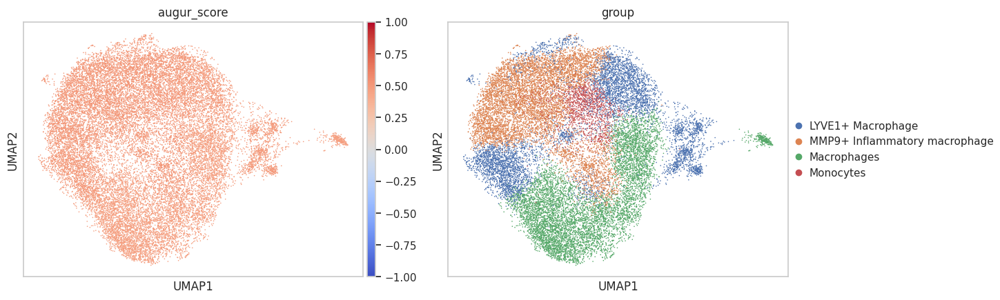

CPU times: user 2min 36s, sys: 48.4 s, total: 3min 25s
Wall time: 3min 9s


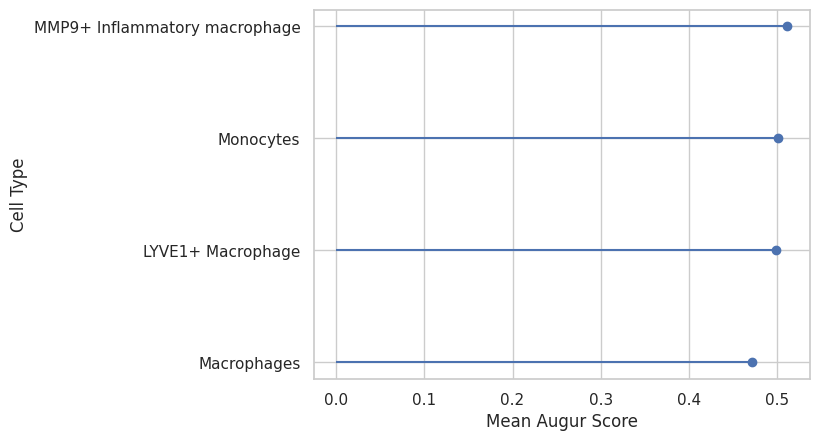

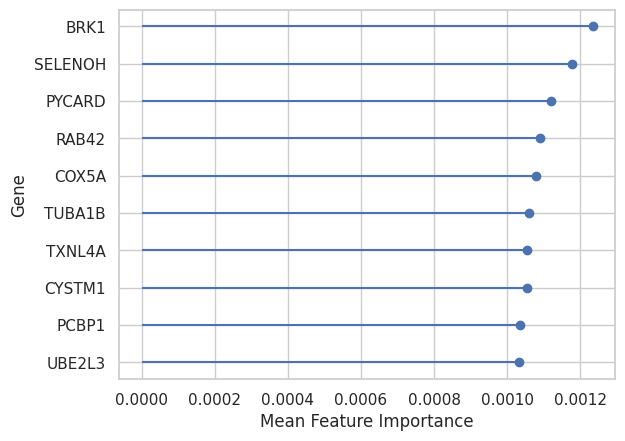

In [10]:
%%time

adata_augur, res_augur, figs_augur = self.run_augur(
    select_variance_features=True,  # filter by highly variable genes
    classifier="random_forest_classifier", n_folds=3, augur_mode="default",
    kws_umap=kws_cluster["kws_umap"], subsample_size=10,
    kws_augur_predict=dict(span=0.7), n_jobs=20)

#### Multi-Cellular Programs

In [17]:
%%time

res_mcp, fig_mcp = self.run_dialogue(n_programs=3)
# res_mcp, fig_mcp = self.run_dialogue(
#     n_programs=2, cmap="coolwarm", col_condition="Oxia",
#     key_control="Normoxia", key_treatment="Hypoxia")

TypeError: can't multiply sequence by non-int of type 'float'

## Other Perturbation Design Analyses

Now let's look at MDP and normoxia conditions (rather than the CRISPRi perturbations, like before).

#### Cell Type Composition

Measure condition-based shifts in cell type composition.

Results are in `self.rna.uns['composition']`.

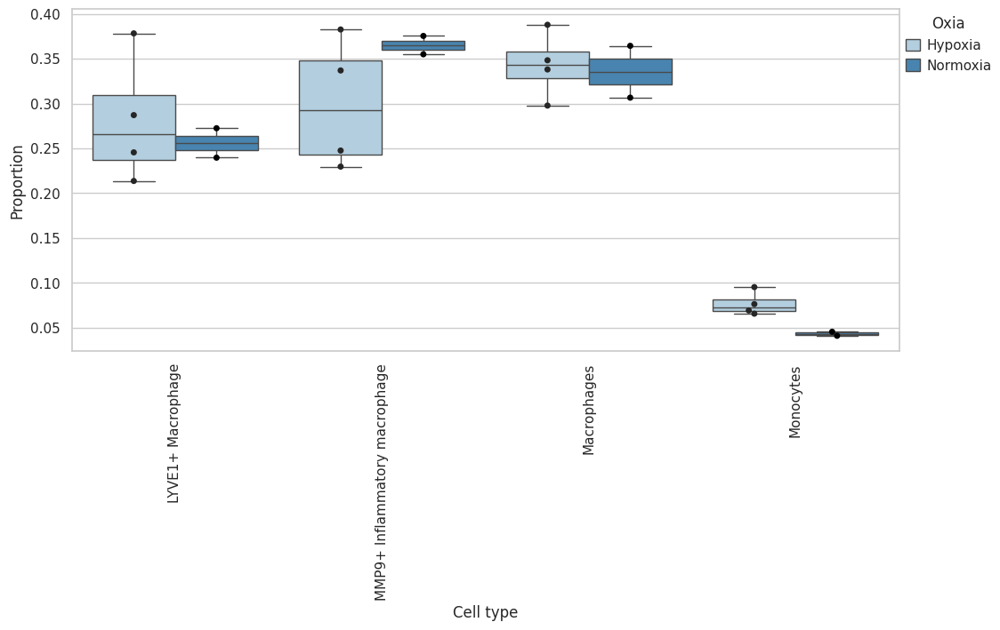

Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
sample: 100%|██████████| 11000/11000 [00:17<00:00, 619.43it/s, 79 steps of size 6.15e-02. acc. prob=0.78]


                                          Compositional Analysis summary                                           
┌──────────────────────────────────────────────┬──────────────────────────────────────────────────────────────────┐
│ Name                                         │ Value                                                            │
├──────────────────────────────────────────────┼──────────────────────────────────────────────────────────────────┤
│ Data                                         │ Data: 6 samples, 4 cell types                                    │
│ Reference cell type                          │ Monocytes                                                        │
│ Formula                                      │ Oxia                                                             │
└──────────────────────────────────────────────┴──────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                Final Parameter  Expected Sample                                                 │
│ Cell Type                                                                                                       │
│ LYVE1+ Macrophage                  3.086           1043.947                                                     │
│ MMP9+ Inflammatory macrophage      3.214           1186.501                                                     │
│ Macrophages                        3.313           1309.976                                                     │
│ Monocytes                          1.693            259.243                                                     │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                               Final Parameter  Expected Sample  log2-fold change                │
│ Covariate      Cell Type                                                                                        │
│ OxiaT.Normoxia LYVE1+ Macrophage                  0.000           1043.947           0.000                      │
│                MMP9+ Inflammatory macrophage      0.000           1186.501           0.000                      │
│                Macrophages                        0.000           1309.976           0.000                      │
│                Monocytes                          0.000            259.243           0.000                      │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

                                          Compositional Analysis summary                                           
┌──────────────────────────────────────────────┬──────────────────────────────────────────────────────────────────┐
│ Name                                         │ Value                                                            │
├──────────────────────────────────────────────┼──────────────────────────────────────────────────────────────────┤
│ Data                                         │ Data: 6 samples, 4 cell types                                    │
│ Reference cell type                          │ Monocytes                                                        │
│ Formula                                      │ Oxia                                                             │
└──────────────────────────────────────────────┴──────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                Final Parameter  Expected Sample                                                 │
│ Cell Type                                                                                                       │
│ LYVE1+ Macrophage                  3.086           1043.947                                                     │
│ MMP9+ Inflammatory macrophage      3.214           1186.501                                                     │
│ Macrophages                        3.313           1309.976                                                     │
│ Monocytes                          1.693            259.243                                                     │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                               Final Parameter  Expected Sample  log2-fold change                │
│ Covariate      Cell Type                                                                                        │
│ OxiaT.Normoxia LYVE1+ Macrophage                  0.000           1043.947           0.000                      │
│                MMP9+ Inflammatory macrophage      0.000           1186.501           0.000                      │
│                Macrophages                        0.000           1309.976           0.000                      │
│                Monocytes                          0.000            259.243           0.000                      │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

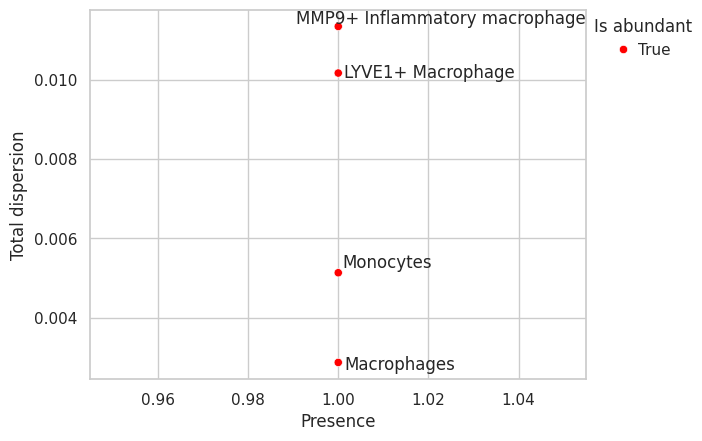

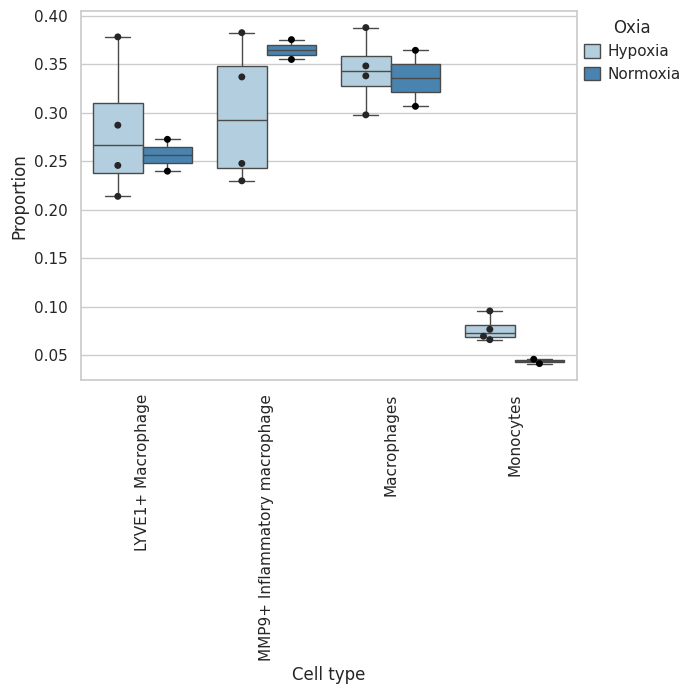

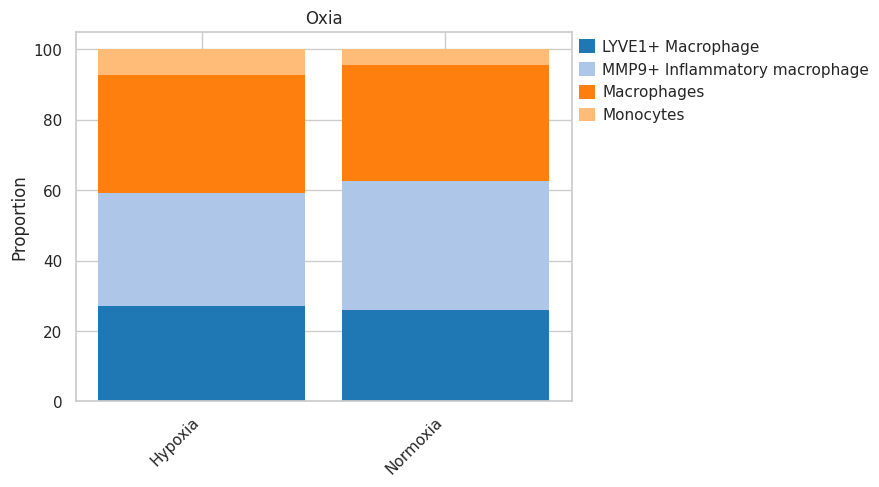

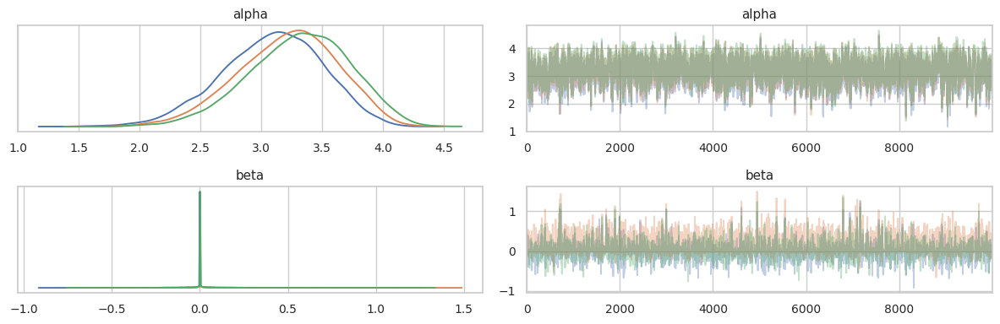




Composition analysis results stored in `self.rna.uns['composition']`.


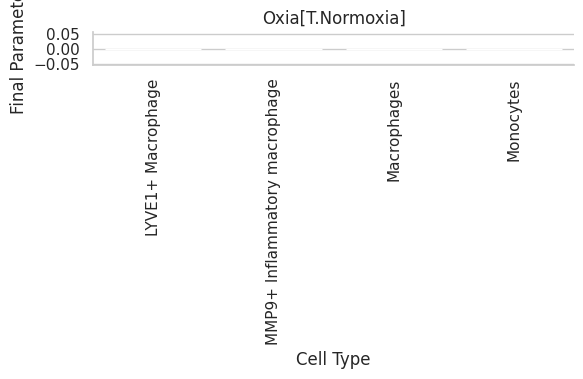

In [12]:
out_comp = self.run_composition_analysis(
    col_condition="Oxia", covariates=["MDP"],
    key_treatment="Hypoxia", key_control="Normoxia",
    col_cell_type=col_annotation, reference_cell_type="Monocytes",
    col_sample_id=self._columns["col_sample_id"])

#### Differential Expression

Pseudo-bulk

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 7.19 seconds.

Fitting dispersion trend curve...
... done in 1.69 seconds.

Fitting MAP dispersions...
... done in 6.23 seconds.

Fitting LFCs...
... done in 4.11 seconds.

Replacing 20 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Running Wald tests...
... done in 3.74 seconds.



Log2 fold change & Wald test p-value: Oxia Normoxia vs Hypoxia
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene_symbols                                                              
A1BG           565.767761       -0.075566  0.154450 -0.489258  0.624659   
A1BG-AS1        83.058861       -0.077572  0.079540 -0.975256  0.329433   
A1CF             0.152866       -0.827088  2.053896 -0.402692  0.687175   
A2M           2786.070312        0.138934  0.091240  1.522735  0.127825   
A2M-AS1          3.876023       -0.145776  0.355171 -0.410438  0.681485   
...                   ...             ...       ...       ...       ...   
ZXDC           279.694580       -0.053902  0.110799 -0.486486  0.626622   
ZYG11A           0.151172        0.449993  3.186903  0.141201  0.887711   
ZYG11B         520.470520        0.598342  0.165787  3.609109  0.000307   
ZYX           2241.584229        0.031382  0.126472  0.248137  0.804029   
ZZEF1          481.630707       -0.09

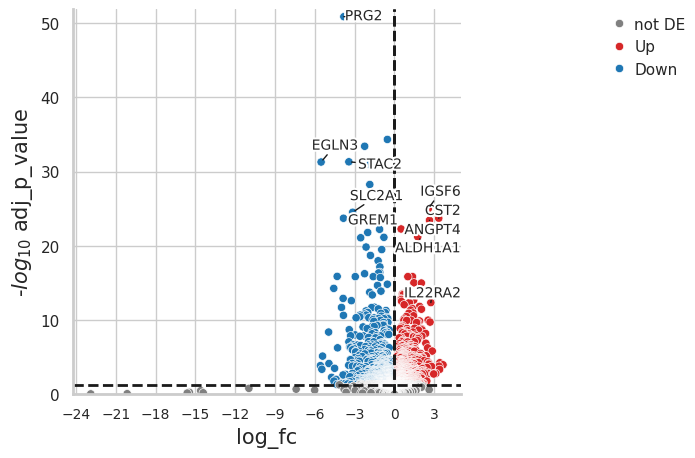

In [13]:
pdata = self.bulk()
model, res = cr.ax.calculate_deg_covariates(
    pdata, layer="counts", col_condition="Oxia", col_covariate="MDP",
    key_control="Normoxia", key_treatment="Hypoxia")

#### Multi-Cellular Programs

In [16]:
%%time

res_mcp, fig_mcp = self.run_dialogue(n_programs=3)
# res_mcp, fig_mcp = self.run_dialogue(
#     n_programs=2, cmap="coolwarm", col_condition="Oxia",
#     key_control="Normoxia", key_treatment="Hypoxia")

TypeError: can't multiply sequence by non-int of type 'float'